# Exploratory Data Analysis and Cleaning for Robo Fault DataSet

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans
from datetime import timedelta
from sklearn.impute import KNNImputer
from sklearn.metrics import davies_bouldin_score
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor
from scipy import stats
from sklearn.metrics import roc_auc_score
from scipy.signal import correlate


# J0

In [2]:
df_joint0_stop = pd.read_csv('Dataset\joint_0_features (1) stop.csv')
df_joint0_stop.head()

,Num,Timestamp,Current_J0,Temperature_T0,Speed_J0,Tool_current,cycle,Robot_ProtectiveStop
0,1,2022-10-26T08:17:21.847Z,0.109628,27.875,2.955651e-01,0.082732,1,0.0
1,2,2022-10-26T08:17:22.852Z,0.595605,27.875,-7.390000e-30,0.505895,1,0.0
2,3,2022-10-26T08:17:23.857Z,-0.229474,27.875,1.369386e-01,0.079420,1,0.0
3,4,2022-10-26T08:17:24.863Z,0.065053,27.875,-9.030032e-02,0.083325,1,0.0
4,5,2022-10-26T08:17:25.877Z,0.884140,27.875,1.268088e-01,0.086379,1,0.0


In [3]:
df_joint0_grip = pd.read_csv('Dataset\joint_0_features (1)_grip.csv')
df_joint0_grip.head()

,Num,Timestamp,Current_J0,Temperature_T0,Speed_J0,Tool_current,cycle,grip_lost
0,1,2022-10-26T08:17:21.847Z,0.109628,27.875,2.955651e-01,0.082732,1,False
1,2,2022-10-26T08:17:22.852Z,0.595605,27.875,-7.390000e-30,0.505895,1,False
2,3,2022-10-26T08:17:23.857Z,-0.229474,27.875,1.369386e-01,0.079420,1,False
3,4,2022-10-26T08:17:24.863Z,0.065053,27.875,-9.030032e-02,0.083325,1,False
4,5,2022-10-26T08:17:25.877Z,0.884140,27.875,1.268088e-01,0.086379,1,False


In [4]:
df_joint0_stop.isnull().sum()

Num                      0
Timestamp                0
Current_J0              46
Temperature_T0          54
Speed_J0                54
Tool_current            54
cycle                    0
Robot_ProtectiveStop    54
dtype: int64

In [5]:
def null_percentage(df):
    null_counts = df.isnull().sum()
    total_rows = len(df)

    null_percentage = (null_counts / total_rows) * 100
    print(null_percentage)

In [6]:
null_percentage(df_joint0_stop)
null_percentage(df_joint0_grip)

Num                     0.000000
Timestamp               0.000000
Current_J0              0.620867
Temperature_T0          0.728843
Speed_J0                0.728843
Tool_current            0.728843
cycle                   0.000000
Robot_ProtectiveStop    0.728843
dtype: float64
Num               0.000000
Timestamp         0.000000
Current_J0        0.620867
Temperature_T0    0.728843
Speed_J0          0.728843
Tool_current      0.728843
cycle             0.000000
grip_lost         0.000000
dtype: float64


In [7]:
df_joint0_stop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Num                   7409 non-null   int64  
 1   Timestamp             7409 non-null   object 
 2   Current_J0            7363 non-null   float64
 3   Temperature_T0        7355 non-null   float64
 4   Speed_J0              7355 non-null   float64
 5   Tool_current          7355 non-null   float64
 6   cycle                 7409 non-null   int64  
 7   Robot_ProtectiveStop  7355 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 463.2+ KB


In [8]:
def check_dubilcate(df):
    duplicates = df.duplicated()
    print(f"Number of duplicate rows: {duplicates.sum()}")


In [9]:
check_dubilcate(df_joint0_stop)
check_dubilcate(df_joint0_grip)

Number of duplicate rows: 0
Number of duplicate rows: 0


In [10]:
def convert_to_timestamp(df):
    df["Timestamp"] = df["Timestamp"].str.replace('"', '', regex=False)

    df["Timestamp"] = pd.to_datetime(df["Timestamp"], utc=True, errors="coerce")

In [11]:
convert_to_timestamp(df_joint0_stop)
convert_to_timestamp(df_joint0_grip)

In [12]:
df_joint0_grip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   Num             7409 non-null   int64              
 1   Timestamp       7409 non-null   datetime64[ns, UTC]
 2   Current_J0      7363 non-null   float64            
 3   Temperature_T0  7355 non-null   float64            
 4   Speed_J0        7355 non-null   float64            
 5   Tool_current    7355 non-null   float64            
 6   cycle           7409 non-null   int64              
 7   grip_lost       7409 non-null   bool               
dtypes: bool(1), datetime64[ns, UTC](1), float64(4), int64(2)
memory usage: 412.5 KB


In [13]:

def remove_strip(df):
        df.columns = df.columns.str.strip()
        return df

df_joint0_stop=remove_strip(df_joint0_stop)
df_joint0_grip=remove_strip(df_joint0_grip)        


# Null Values

In [14]:
def fill_null_with_fandb(df):
    clean_data = df.groupby('cycle').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
    return clean_data

In [15]:
df_joint0_stop_clean=fill_null_with_fandb(df_joint0_stop)


C:\Users\FH\AppData\Local\Temp\ipykernel_27292\428220627.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  clean_data = df.groupby('cycle').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


In [16]:
df_joint0_stop_clean.isnull().sum()

Num                     0
Timestamp               0
Current_J0              0
Temperature_T0          0
Speed_J0                0
Tool_current            0
cycle                   0
Robot_ProtectiveStop    0
dtype: int64

In [17]:
df_joint0_grip_clean=fill_null_with_fandb(df_joint0_grip)
df_joint0_grip_clean.isnull().sum()

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\428220627.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  clean_data = df.groupby('cycle').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


Num               0
Timestamp         0
Current_J0        0
Temperature_T0    0
Speed_J0          0
Tool_current      0
cycle             0
grip_lost         0
dtype: int64

# feature engineering

In [18]:
def add_robot_features(df, dt=1.0):
    df = df.copy()
    curr_cols = [c for c in df.columns if c.startswith('Current_J')]
    spd_cols  = [c for c in df.columns if c.startswith('Speed_J')]
    tmp_cols  = [c for c in df.columns if c.startswith('Temperature')]
    for j in range(6):
        c, s = f'Current_J{j}', f'Speed_J{j}'
        if c in df and s in df:
            df[f'abs_{c}'] = df[c].abs()
            df[f'abs_{s}'] = df[s].abs()
            df[f'sudden{j}'] = df[s].diff() / dt
            df[f'power_J{j}'] = df[c].abs() * df[s].abs()
    return df
df_joint0_stop_clean = add_robot_features(df_joint0_stop_clean)
df_joint0_grip_clean = add_robot_features(df_joint0_grip_clean)

In [19]:
df_joint0_stop_clean

Num                        Timestamp  Current_J0  Temperature_T0  \
cycle                                                                           
1     0        1 2022-10-26 08:17:21.847000+00:00    0.109628         27.8750   
      1        2 2022-10-26 08:17:22.852000+00:00    0.595605         27.8750   
      2        3 2022-10-26 08:17:23.857000+00:00   -0.229474         27.8750   
      3        4 2022-10-26 08:17:24.863000+00:00    0.065053         27.8750   
      4        5 2022-10-26 08:17:25.877000+00:00    0.884140         27.8750   
...          ...                              ...         ...             ...   
264   7404  7405 2022-10-26 15:36:02.555000+00:00   -0.109017         37.1875   
      7405  7406 2022-10-26 15:36:03.562000+00:00   -0.098536         37.1875   
      7406  7407 2022-10-26 15:36:04.571000+00:00   -0.121100         37.1875   
      7407  7408 2022-10-26 15:36:05.572000+00:00   -0.129370         37.1875   
      7408  7409 2022-10-26 15:36:06.580000+00:00   -0.134429         37.1250   

                Speed_J0  Tool_current  cycle  Robot_ProtectiveStop  \
cycle                                                                 
1     0     2.955651e-01      0.082732      1                   0.0   
      1    -7.390000e-30      0.505895      1                   0.0   
      2     1.369386e-01      0.079420      1                   0.0   
      3    -9.030032e-02      0.083325      1                   0.0   
      4     1.268088e-01      0.086379      1                   0.0   
...                  ...           ...    ...                   ...   
264   7404  0.000000e+00      0.080013    264                   0.0   
      7405  0.000000e+00      0.078740    264                   0.0   
      7406  0.000000e+00      0.091471    264                   0.0   
      7407  0.000000e+00      0.090026    264                   0.0   
      7408  0.000000e+00      0.089097    264                   0.0   

            abs_Current_J0  abs_Speed_J0   sudden0      power_J0  
cycle                                                             
1     0           0.109628  2.955651e-01       NaN  3.240209e-02  
      1           0.595605  7.390000e-30 -0.295565  4.401522e-30  
      2           0.229474  1.369386e-01  0.136939  3.142382e-02  
      3           0.065053  9.030032e-02 -0.227239  5.874323e-03  
      4           0.884140  1.268088e-01  0.217109  1.121168e-01  
...                    ...           ...       ...           ...  
264   7404        0.109017  0.000000e+00  0.000000  0.000000e+00  
      7405        0.098536  0.000000e+00  0.000000  0.000000e+00  
      7406        0.121100  0.000000e+00  0.000000  0.000000e+00  
      7407        0.129370  0.000000e+00  0.000000  0.000000e+00  
      7408        0.134429  0.000000e+00  0.000000  0.000000e+00  

[7409 rows x 12 columns]

# EDA

In [20]:


def univariate_analysis(df, features, target):
    y = df[target].astype(int).values
    results = []
    for f in features:
        x = df[f].values
     
        x0, x1 = x[y==0], x[y==1]
        
        t, p = stats.ttest_ind(x0, x1, equal_var=False, nan_policy="omit")
        
        s0, s1 = x0.std(ddof=1), x1.std(ddof=1)
        sp = np.sqrt(((len(x0)-1)*s0**2 + (len(x1)-1)*s1**2) / (len(x0)+len(x1)-2))
        d = (x1.mean() - x0.mean()) / sp if sp > 0 else np.nan
        
        auc = roc_auc_score(y, x) if len(np.unique(y)) == 2 else np.nan
        results.append({
            "feature": f,
            "mean_no_fault": np.mean(x0),
            "mean_fault": np.mean(x1),
            "cohens_d": d,
            "t_stat": t,
            "p_value": p,
            "AUC": auc
        })
    return pd.DataFrame(results).sort_values("p_value")


features = ["Current_J0","Temperature_T0","Speed_J0","Tool_current"]
uni_stop = univariate_analysis(df_joint0_stop_clean, features, "Robot_ProtectiveStop")
uni_stop




,feature,mean_no_fault,mean_fault,cohens_d,t_stat,p_value,AUC
3,Tool_current,0.110511,0.088449,-0.279074,8.781327,5.679781e-17,0.419020
1,Temperature_T0,34.884283,35.730063,0.307080,-6.138063,2.530407e-09,0.593254
2,Speed_J0,0.002116,-0.004915,-0.047201,2.417429,1.587951e-02,0.467948
0,Current_J0,-0.051095,0.025440,0.091966,-2.087744,3.760191e-02,0.565948


In [21]:
uni_grip = univariate_analysis(df_joint0_grip_clean, features, "grip_lost")
uni_grip

,feature,mean_no_fault,mean_fault,cohens_d,t_stat,p_value,AUC
1,Temperature_T0,34.960630,33.603909,-0.493646,5.930738,9.905253e-09,0.402044
3,Tool_current,0.110131,0.096362,-0.174017,4.621603,5.669026e-06,0.495374
2,Speed_J0,0.001235,0.020005,0.126033,-2.490364,1.336036e-02,0.566018
0,Current_J0,-0.050048,0.005904,0.067228,-1.405197,1.610915e-01,0.514501


In [22]:
def quartile_fault_analysis(df, feature, target):

    quartiles = pd.qcut(df[feature], 4, labels=["Q1","Q2","Q3","Q4"])
    bins = pd.qcut(df[feature], 4)  
    
    df = df.copy()
    df["quartile"] = quartiles
    
    
    result = df.groupby("quartile")[target].agg(
        fault_rate="mean",
        count="size"
    ).reset_index()
    

    result["range"] = bins.unique().sort_values().astype(str).tolist()
    
    return result

q_temp = quartile_fault_analysis(df_joint0_stop_clean, "Temperature_T0", "Robot_ProtectiveStop")
q_temp

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.021902,1872,"(27.811, 33.0]"
1,Q2,0.034447,1916,"(33.0, 36.562]"
2,Q3,0.042630,1947,"(36.562, 37.062]"
3,Q4,0.053166,1674,"(37.062, 37.25]"


In [23]:
q_temp_grip = quartile_fault_analysis(df_joint0_grip_clean, "Temperature_T0", "grip_lost")
q_temp_grip

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.055021,1872,"(27.811, 33.0]"
1,Q2,0.016701,1916,"(33.0, 36.562]"
2,Q3,0.039548,1947,"(36.562, 37.062]"
3,Q4,0.018519,1674,"(37.062, 37.25]"


In [24]:


q_temp_stop_per_current = quartile_fault_analysis(df_joint0_stop_clean, "Current_J0", "Robot_ProtectiveStop")
q_temp_stop_per_current

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.018888,1853,"(-6.2490000000000006, -0.195]"
1,Q2,0.032397,1852,"(-0.195, -0.0804]"
2,Q3,0.065335,1852,"(-0.0804, 0.0967]"
3,Q4,0.034017,1852,"(0.0967, 6.807]"


In [25]:
q_temp_grip_per_current=quartile_fault_analysis(df_joint0_grip_clean, "Current_J0", "grip_lost")
q_temp_grip_per_current

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.025364,1853,"(-6.2490000000000006, -0.195]"
1,Q2,0.039957,1852,"(-0.195, -0.0804]"
2,Q3,0.030778,1852,"(-0.0804, 0.0967]"
3,Q4,0.035097,1852,"(0.0967, 6.807]"


In [26]:


q_temp_speed_srtop = quartile_fault_analysis(df_joint0_stop_clean, "Speed_J0", "Robot_ProtectiveStop")
q_temp_speed_srtop


C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.022666,1853,"(-0.657, -0.000481]"
1,Q2,0.057153,2922,"(-0.000481, 0.0]"
2,Q3,0.062660,782,"(0.0, 0.00223]"
3,Q4,0.011339,1852,"(0.00223, 0.792]"


In [27]:
q_temp_speed_grip=quartile_fault_analysis(df_joint0_grip_clean, "Speed_J0", "grip_lost")
q_temp_speed_grip

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.030761,1853,"(-0.657, -0.000481]"
1,Q2,0.024298,2922,"(-0.000481, 0.0]"
2,Q3,0.020460,782,"(0.0, 0.00223]"
3,Q4,0.053456,1852,"(0.00223, 0.792]"


In [28]:


q_temp_tool_stop = quartile_fault_analysis(df_joint0_stop_clean, "Tool_current", "Robot_ProtectiveStop")
q_temp_tool_stop

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.040021,1874,"(0.0192, 0.0825]"
1,Q2,0.052603,1863,"(0.0825, 0.0852]"
2,Q3,0.039825,1833,"(0.0852, 0.0895]"
3,Q4,0.017945,1839,"(0.0895, 0.602]"


In [29]:


q_temp_tool_grip = quartile_fault_analysis(df_joint0_grip_clean, "Tool_current", "grip_lost")
q_temp_tool_grip

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\2829786370.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.032551,1874,"(0.0192, 0.0825]"
1,Q2,0.032206,1863,"(0.0825, 0.0852]"
2,Q3,0.031097,1833,"(0.0852, 0.0895]"
3,Q4,0.035345,1839,"(0.0895, 0.602]"


In [30]:


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)




In [31]:

def  stats_protective(df,columns):
    
    stats = df.groupby('Robot_ProtectiveStop')[[columns]].describe()
    return stats


In [32]:
stats_protective(df_joint0_stop_clean,'Temperature_T0')


Temperature_T0                                         \
                              count       mean       std      min      25%   
Robot_ProtectiveStop                                                         
0.0                          7130.0  34.884283  2.772538  27.8125  32.9375   
1.0                           279.0  35.730063  2.235291  27.8750  34.3750   

                                               
                          50%      75%    max  
Robot_ProtectiveStop                           
0.0                   36.5000  37.0625  37.25  
1.0                   36.9375  37.1250  37.25

In [33]:
stats_protective(df_joint0_stop_clean,'Current_J0')


Current_J0                                          \
                          count      mean       std       min       25%   
Robot_ProtectiveStop                                                      
0.0                      7130.0 -0.051095  0.840257 -6.247756 -0.197858   
1.0                       279.0  0.025440  0.589339 -2.274941 -0.122589   

                                                    
                           50%       75%       max  
Robot_ProtectiveStop                                
0.0                  -0.083188  0.099549  6.460328  
1.0                  -0.020993  0.084020  6.806938

In [34]:
stats_protective(df_joint0_stop_clean,'Speed_J0')


Speed_J0                                               \
                        count      mean       std       min       25%  50%   
Robot_ProtectiveStop                                                         
0.0                    7130.0  0.002116  0.151646 -0.656331 -0.000538  0.0   
1.0                     279.0 -0.004915  0.038213 -0.332335 -0.000079  0.0   

                                              
                               75%       max  
Robot_ProtectiveStop                          
0.0                   3.457672e-03  0.791929  
1.0                   3.145000e-43  0.129558

In [35]:
stats_protective(df_joint0_stop_clean,'Tool_current')

Tool_current                                         \
                            count      mean       std      min       25%   
Robot_ProtectiveStop                                                       
0.0                        7130.0  0.110511  0.080215  0.02018  0.082473   
1.0                         279.0  0.088449  0.038849  0.07450  0.081966   

                                                    
                           50%       75%       max  
Robot_ProtectiveStop                                
0.0                   0.085192  0.089604  0.602054  
1.0                   0.084426  0.086422  0.501310

In [36]:
def stats_grip(df,columns):
    stats=df.groupby("grip_lost")[[columns]].describe()
    return stats

In [37]:
stats_grip(df_joint0_grip_clean,'Temperature_T0')

Temperature_T0                                                  \
                   count       mean       std      min      25%      50%   
grip_lost                                                                  
False             7166.0  34.960630  2.718012  27.8125  33.0625  36.5625   
True               243.0  33.603909  3.530728  27.9375  29.3125  34.0000   

                           
               75%    max  
grip_lost                  
False      37.0625  37.25  
True       37.0000  37.25

In [38]:
stats_grip(df_joint0_grip_clean,'Current_J0')

Current_J0                                                    \
               count      mean       std       min       25%       50%   
grip_lost                                                                
False         7166.0 -0.050048  0.838970 -6.247756 -0.195976 -0.080521   
True           243.0  0.005904  0.601167 -2.395309 -0.179904 -0.079560   

                               
                75%       max  
grip_lost                      
False      0.096123  6.806938  
True       0.105224  5.510250

In [39]:
stats_grip(df_joint0_grip_clean,'Speed_J0')

Speed_J0                                                         \
             count      mean       std       min       25%  50%       75%   
grip_lost                                                                   
False       7166.0  0.001235  0.149958 -0.656331 -0.000484  0.0  0.001510   
True         243.0  0.020005  0.114196 -0.395030 -0.000097  0.0  0.077606   

                     
                max  
grip_lost            
False      0.791929  
True       0.285812

In [40]:
stats_grip(df_joint0_grip_clean,'Tool_current')

Tool_current                                                    \
                 count      mean       std       min       25%       50%   
grip_lost                                                                  
False           7166.0  0.110131  0.080044  0.020180  0.082473  0.085106   
True             243.0  0.096362  0.044043  0.076194  0.082517  0.085192   

                               
                75%       max  
grip_lost                      
False      0.089518  0.602054  
True       0.089604  0.480941

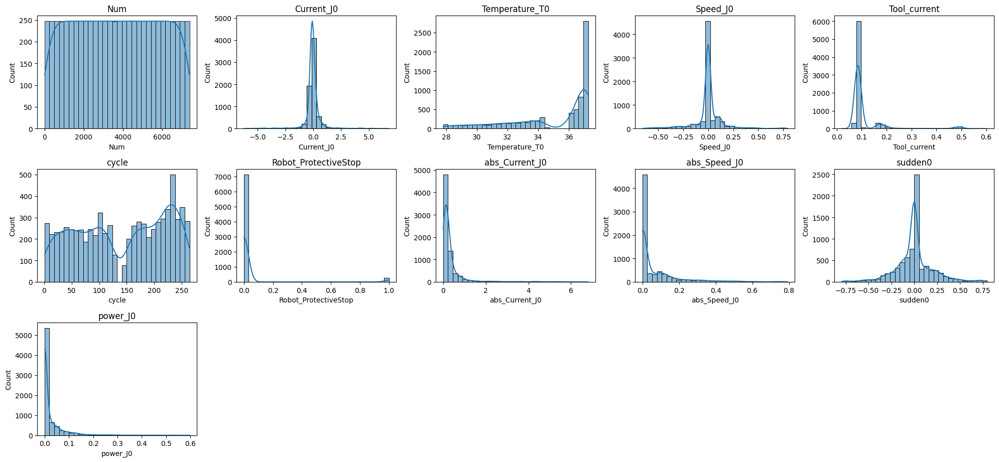

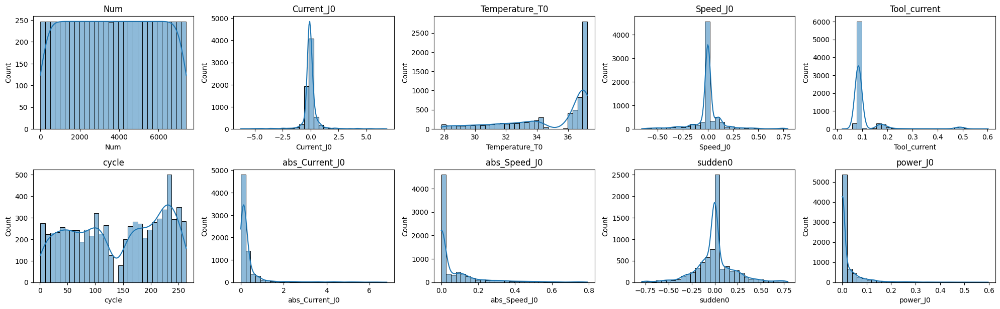

In [41]:
def plot_histograms(df):
    numerical_cols = df.select_dtypes(include=[np.number]).columns

    plt.figure(figsize=(20, 15))
    for i, col in enumerate(numerical_cols, 1):
        plt.subplot(5, 5, i)
        sns.histplot(df[col], kde=True, bins=30)
        plt.title(col)
        plt.tight_layout()

    plt.show()
plot_histograms(df_joint0_stop_clean)
plot_histograms(df_joint0_grip_clean)

**Currents (Current_J0):**

Mostly centered around 0, with symmetric bell-like shapes robot joints normally operate near zero torque when idle.

joint (like J1) show heavy tails   these joints experience higher torque variation, maybe because they handle more load.


**Temperatures (Temperature_T0):**

Distributions are not Gaussian 


**Speeds (Speed_J0):**

Extremely narrow, centered around 0.

Suggests most of the time, the robot joints are either stopped or moving very slowly.

Occasional values far from 0 indicate bursts of motion.

**Tool_current:**

Also tightly clustered, mostly around 0.1–0.2.

Rare higher values indicate the gripper is under load.



Robot_ProtectiveStop has nulls and it's an important feature and what is it's balance 
For the nulls I think Each cycle has many time-series rows until the task finishes.
so we can use the cycle to see through the task the robot had to make a protectivestop or not and use the mode of the protectivestop in the cycle to fill this nulls

In [42]:
def plot_balance(df,x,title,xlabel):
    sns.countplot(x=x, data=df)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Count')
    plt.show()

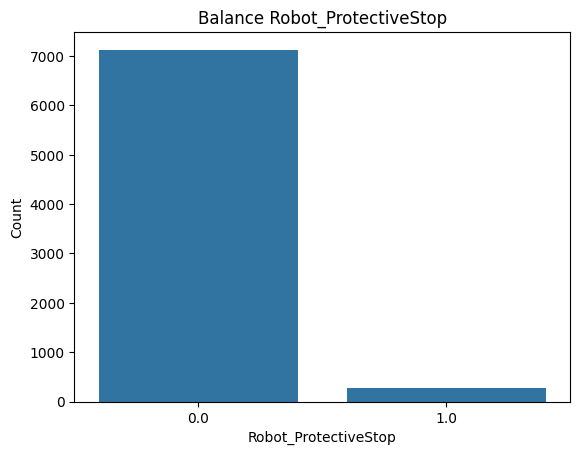

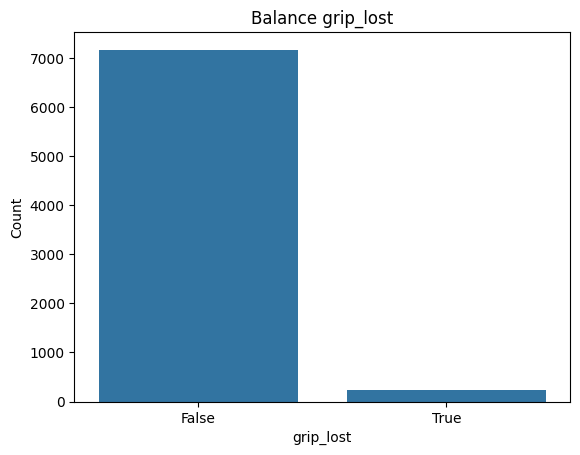

In [43]:
plot_balance(df_joint0_stop_clean,"Robot_ProtectiveStop","Balance Robot_ProtectiveStop","Robot_ProtectiveStop")
plot_balance(df_joint0_grip_clean,"grip_lost","Balance grip_lost","grip_lost")

In [44]:
def percentage_balance(df, column):
    counts = df[column].value_counts(normalize=True) * 100
    for value, pct in counts.items():
        print(f"{column} = {value}: {pct:.2f}%")
percentage_balance(df_joint0_stop_clean,"Robot_ProtectiveStop")
percentage_balance(df_joint0_grip_clean,"grip_lost")


Robot_ProtectiveStop = 0.0: 96.23%
Robot_ProtectiveStop = 1.0: 3.77%
grip_lost = False: 96.72%
grip_lost = True: 3.28%


Robot_Protectivestop is soo unbalanced to the zero class which means that the faults are the minority that makes the robot stops

In [45]:
def check_skewness(df):
    numerical_cols = df.select_dtypes(include=[np.number]).columns
    skewness = df[numerical_cols].skew().sort_values(ascending=False)
    return skewness
check_skewness(df_joint0_stop_clean)



Robot_ProtectiveStop    4.858420
abs_Current_J0          4.785083
power_J0                4.284105
Tool_current            3.895219
abs_Speed_J0            2.567297
Speed_J0                0.214335
sudden0                 0.194919
Current_J0              0.031585
Num                     0.000000
cycle                  -0.142791
Temperature_T0         -1.012344
dtype: float64

In [46]:
check_skewness(df_joint0_grip_clean)


abs_Current_J0    4.785083
power_J0          4.284105
Tool_current      3.895219
abs_Speed_J0      2.567297
Speed_J0          0.214335
sudden0           0.194919
Current_J0        0.031585
Num               0.000000
cycle            -0.142791
Temperature_T0   -1.012344
dtype: float64

In [47]:
def correlation_heatmap(df):
    numerical_cols = df.select_dtypes(include=[np.number]).columns
        
    plt.figure(figsize=(18,10))
    sns.heatmap(df[numerical_cols].corr(), cmap="coolwarm", annot=True)
    plt.title("Correlation Heatmap of Numeric Features")
    plt.show()


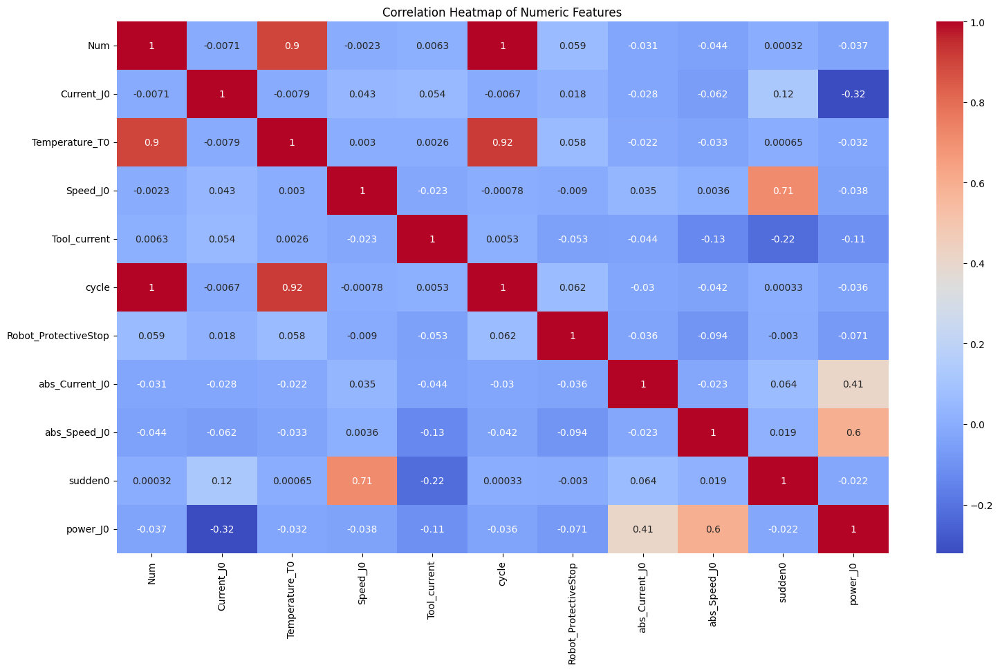

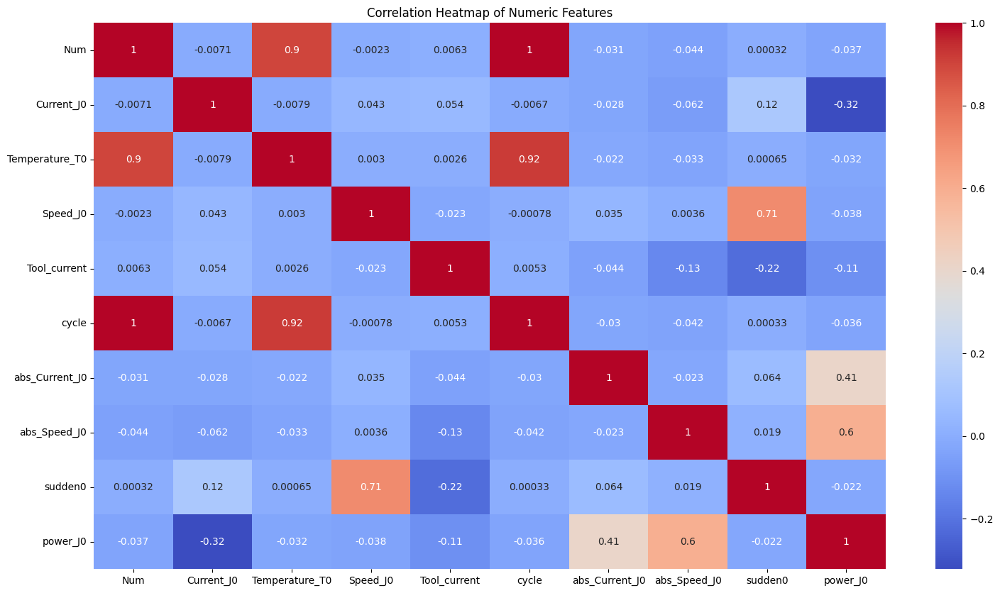

In [48]:
correlation_heatmap(df_joint0_stop_clean)
correlation_heatmap(df_joint0_grip_clean)



Current and Speed (same joint) are small-to-moderate (∼0.2–0.4)

Cross-joint speeds show  negative correlations (maybe some joints move opposite to others).

A few striking pairs (Current_J5 and  Speed_J4) and (Current_J4 and  Current_J0)


In [49]:
def scatter_plot_between_temp(x, y, title):
    
    sns.scatterplot(x=x, y=y)
    plt.title(title)

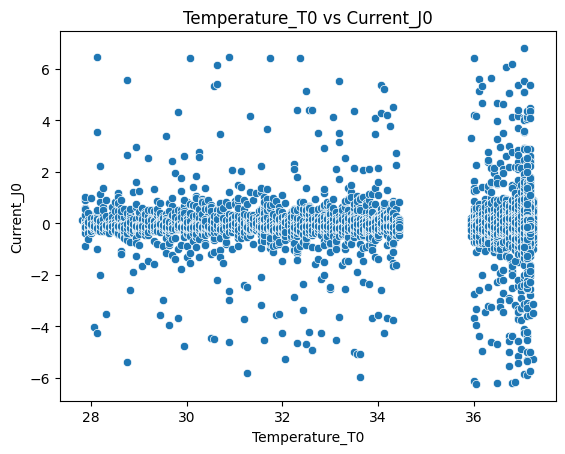

In [50]:
scatter_plot_between_temp(df_joint0_stop_clean['Temperature_T0'], df_joint0_stop_clean['Current_J0'], 'Temperature_T0 vs Current_J0')


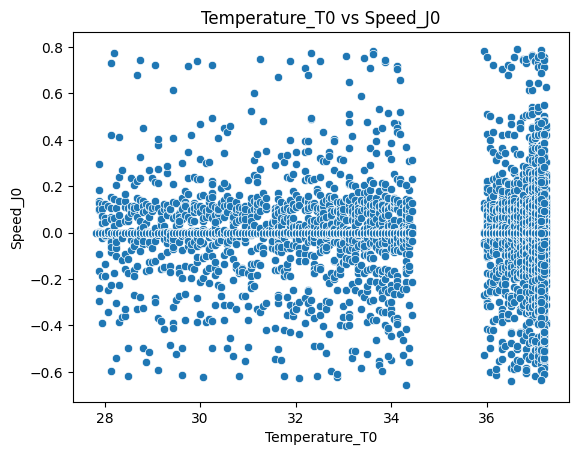

In [51]:
scatter_plot_between_temp(df_joint0_stop_clean['Temperature_T0'], df_joint0_stop_clean['Speed_J0'], 'Temperature_T0 vs Speed_J0')


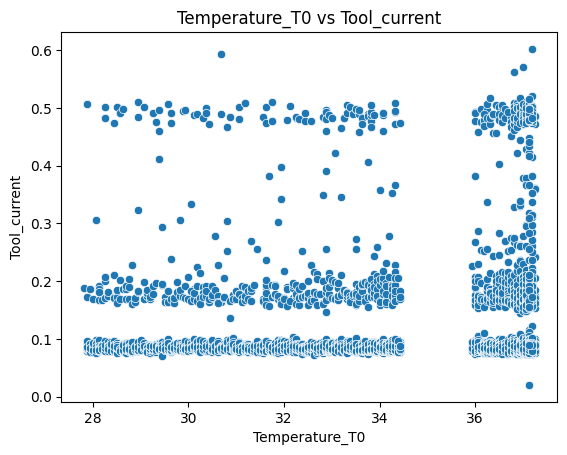

In [52]:
scatter_plot_between_temp(df_joint0_stop_clean['Temperature_T0'], df_joint0_stop_clean['Tool_current'], 'Temperature_T0 vs Tool_current')

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\1956437239.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


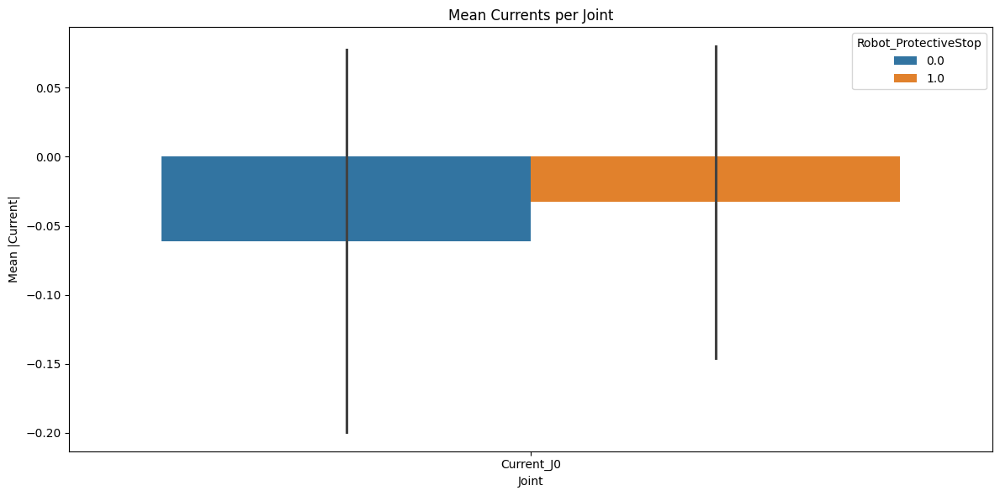

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\1956437239.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


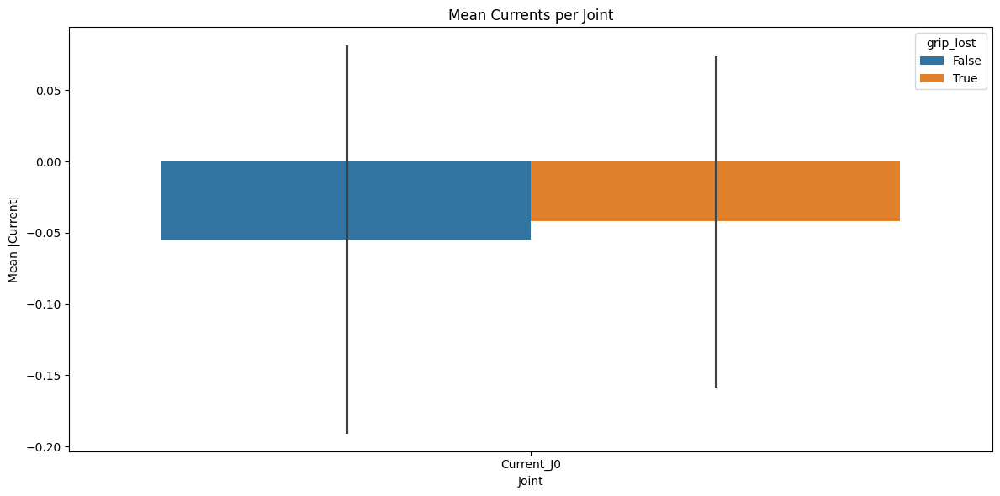

In [55]:


def plot_currents(df, cycle_col="cycle", stop_col="Robot_ProtectiveStop"):
    if cycle_col in df.index.names and cycle_col in df.columns:
        df = df.reset_index(drop=True)  
    elif cycle_col in df.index.names:
        df = df.reset_index()  

    df.columns = df.columns.str.strip()

    currents = [c for c in df.columns if c.startswith("Current_J")]

    if not currents:
        raise ValueError("No abs_Current_J* columns found in dataframe.")

    cycle_means = (
        df.groupby(cycle_col)
          .agg({stop_col: 'max', **{c: 'mean' for c in currents}})
          .reset_index()
    )

    if len(currents) == 1:
        long_curr = cycle_means.rename(columns={currents[0]: "abs_current_mean"})
        long_curr["joint"] = currents[0]
    else:
        long_curr = cycle_means.melt(
            id_vars=[cycle_col, stop_col],
            value_vars=currents,
            var_name='joint',
            value_name='abs_current_mean'
        )

    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=long_curr,
        x='joint',
        y='abs_current_mean',
        hue=stop_col,
        ci='sd'
    )
    plt.title("Mean Currents per Joint")
    plt.xlabel("Joint")
    plt.ylabel("Mean |Current|")
    plt.tight_layout()
    plt.show()


plot_currents(df_joint0_stop_clean)
plot_currents(df_joint0_grip_clean, stop_col="grip_lost")


### Mean Currents per Joint (Normal vs Stop)

- **J1** shows the highest mean current across all joints (~2.3), followed by **J2** and **J3 **.  
- In **stop cycles**, J1 and J2 currents are slightly higher than in normal cycles.  
- **J0, J4, J5** draw very low current overall and show little difference between stop and non-stop cycles.  
- Protective stops are strongly tied to higher currents in **load-bearing joints (J1 and J2)**.  
- This suggests that mechanical overload in these joints is a major factor in triggering stops.  
  


C:\Users\FH\AppData\Local\Temp\ipykernel_27292\1780988295.py:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


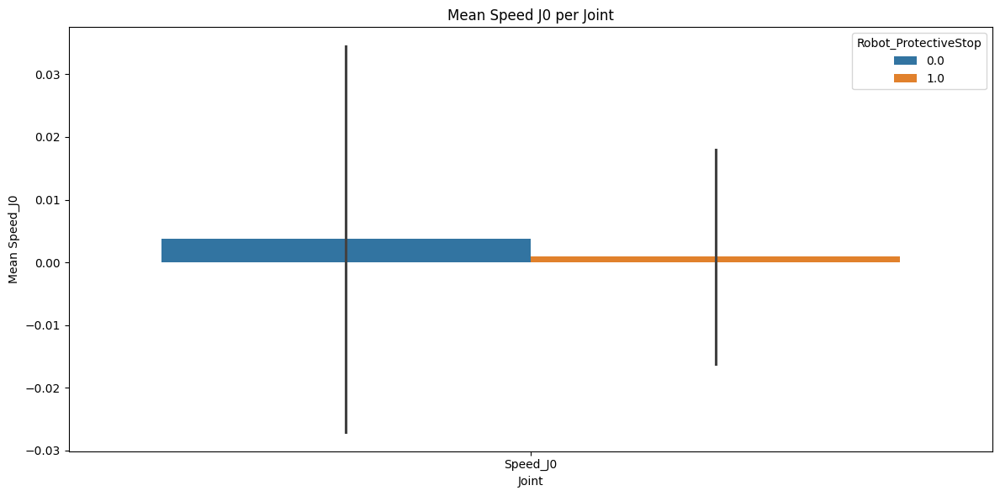

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\1780988295.py:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


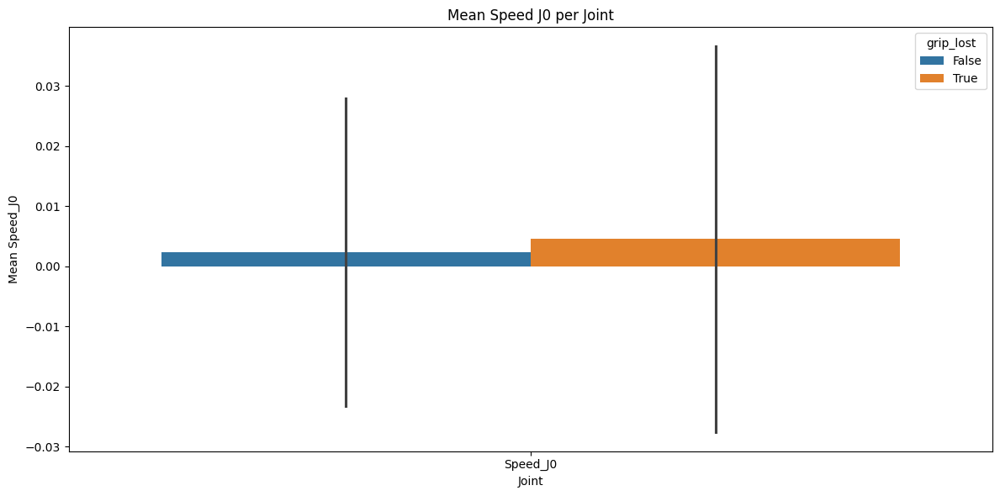

,cycle,grip_lost,joint,Speed_J0_mean
0,1,False,Speed_J0,0.002871
1,2,True,Speed_J0,-0.021574
2,3,False,Speed_J0,0.041802
3,4,False,Speed_J0,-0.045516
4,5,True,Speed_J0,0.031089
5,6,True,Speed_J0,-0.018337
6,7,False,Speed_J0,-0.033138
7,8,False,Speed_J0,0.004875
8,9,False,Speed_J0,0.039223
9,10,False,Speed_J0,0.029677


In [56]:
def plot_speed_feature(df, prefix="Speed_J", cycle_col="cycle", stop_col="Robot_ProtectiveStop"):
   
    if cycle_col in df.index.names and cycle_col in df.columns:
        df = df.reset_index(drop=True)
    elif cycle_col in df.index.names:
        df = df.reset_index()
    speed_cols = [c for c in df.columns if c.startswith(prefix)]
    if not speed_cols:
        raise ValueError(f"No {prefix}* columns found in dataframe.")
    cycle_speeds = (
        df.groupby(cycle_col)
          .agg({stop_col: 'max', **{c: 'mean' for c in speed_cols}})
          .reset_index()
    )
    long_speed = cycle_speeds.melt(
        id_vars=[cycle_col, stop_col],
        value_vars=speed_cols,
        var_name='joint',
        value_name=f'{prefix}_mean'
    )
    plt.figure(figsize=(12,6))
    sns.barplot(
        data=long_speed,
        x='joint',
        y=f'{prefix}_mean',
        hue=stop_col,
        ci='sd'
    )
    plt.title(f"Mean {prefix.replace('_',' ')} per Joint")
    plt.xlabel("Joint")
    plt.ylabel(f"Mean {prefix}")
    plt.tight_layout()
    plt.show()
    return long_speed
plot_speed_feature(df_joint0_stop_clean, prefix="Speed_J0", stop_col="Robot_ProtectiveStop")
plot_speed_feature(df_joint0_grip_clean, prefix="Speed_J0", stop_col="grip_lost")

### Mean Speeds per Joint (Normal vs Stop)

- J2, J3, and J5 joints have the highest average speeds across cycles.  
- In **stop cycles**, speeds are consistently lower compared to normal ones.  
- This suggests that **protective stops are not triggered by high-speed motions**.  
- Instead, the robot may be stopping during **slower but high-load movements**.  


C:\Users\youss\AppData\Local\Temp\ipykernel_13336\3436744854.py:24: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


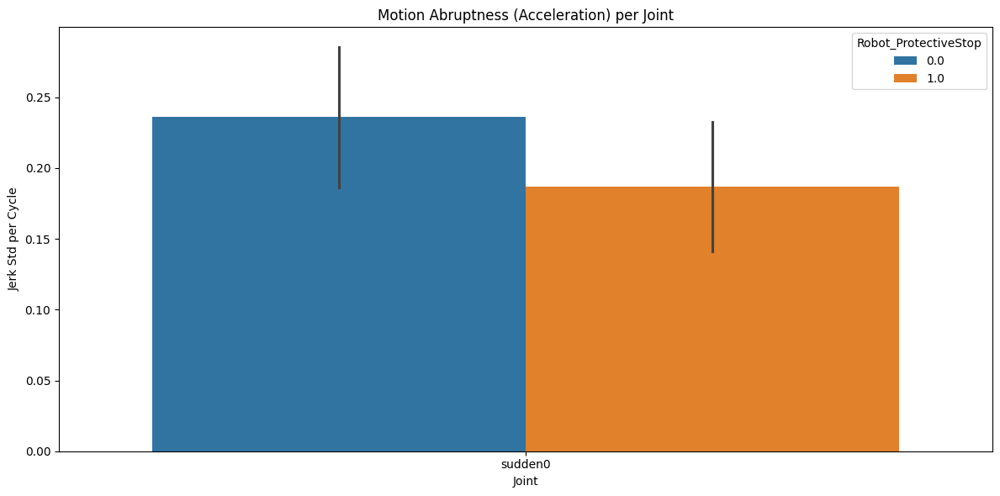

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\3436744854.py:24: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


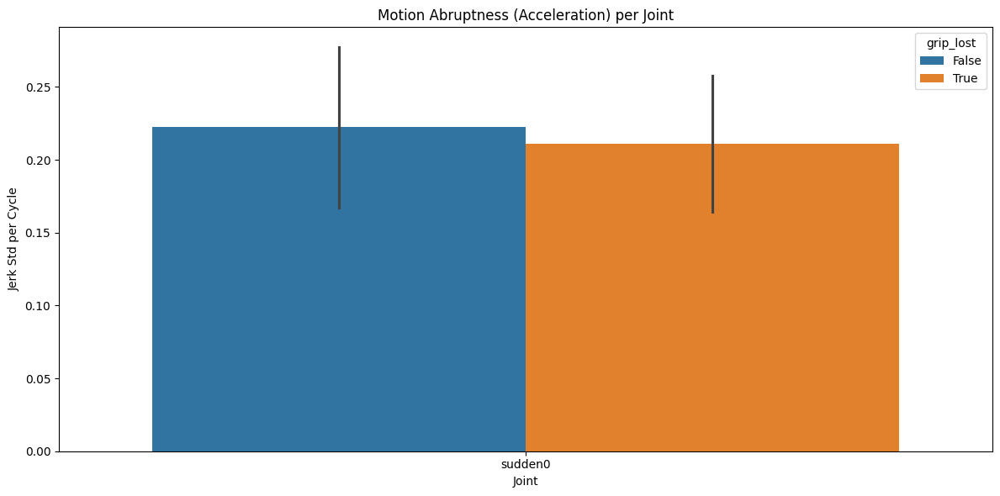

,cycle,grip_lost,joint,jerk_std
0,1,False,sudden0,0.151121
1,2,True,sudden0,0.159693
2,3,False,sudden0,0.252345
3,4,False,sudden0,0.289791
4,5,True,sudden0,0.283931
...,...,...,...,...
235,260,False,sudden0,0.195193
236,261,False,sudden0,0.258744
237,262,True,sudden0,0.268759
238,263,False,sudden0,0.100188


In [ ]:
def plot_Acceleration(df, cycle_col="cycle", stop_col="Robot_ProtectiveStop"):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()
    if cycle_col in df.index.names and cycle_col in df.columns:
        df = df.reset_index(drop=True)
    elif cycle_col in df.index.names:
        df = df.reset_index()
    sudden_cols = [f'sudden{j}' for j in range(6) if f'sudden{j}' in df.columns]
    if not sudden_cols:
        raise ValueError("No sudden* columns found in dataframe.")
    cycle_jerk = (
        df.groupby(cycle_col)
          .agg({stop_col: 'max', **{c: 'std' for c in sudden_cols}})
          .reset_index()
    )
    long_jerk = cycle_jerk.melt(
        id_vars=[cycle_col, stop_col],
        value_vars=sudden_cols,
        var_name='joint',
        value_name='jerk_std'
    )
    plt.figure(figsize=(12,6))
    sns.barplot(
        data=long_jerk,
        x='joint',
        y='jerk_std',
        hue=stop_col,
        ci='sd'
    )
    plt.title("Motion Abruptness (Acceleration) per Joint")
    plt.xlabel("Joint")
    plt.ylabel("Jerk Std per Cycle")
    plt.tight_layout()
    plt.show()
    return long_jerk
plot_Acceleration(df_joint0_stop_clean, stop_col="Robot_ProtectiveStop")
plot_Acceleration(df_joint0_grip_clean, stop_col="grip_lost")

### Motion Abruptness (Jerk Std) per Joint

- J2 exhibits the highest jerk variability among all joints.  
- In **stop cycles**, jerk variability is slightly lower than in normal cycles.  
- This indicates that **protective stops are not caused by abrupt or jerky movements**.  
- The main factor behind stops is likely sustained load/overload rather than sudden motion.  


### Total Effort (Power) per Joint

- J2 contributes the most to total power consumption, followed by J3 and J1.  
- In **stop cycles**, J2 and J3 show slightly higher power than in normal cycles.  
- This pattern suggests that **protective stops are linked to high workload/effort** in the main load-bearing joints.  
- Monitoring power usage could serve as an **early warning feature** for predicting stops.  


C:\Users\youss\AppData\Local\Temp\ipykernel_13336\1195766569.py:30: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


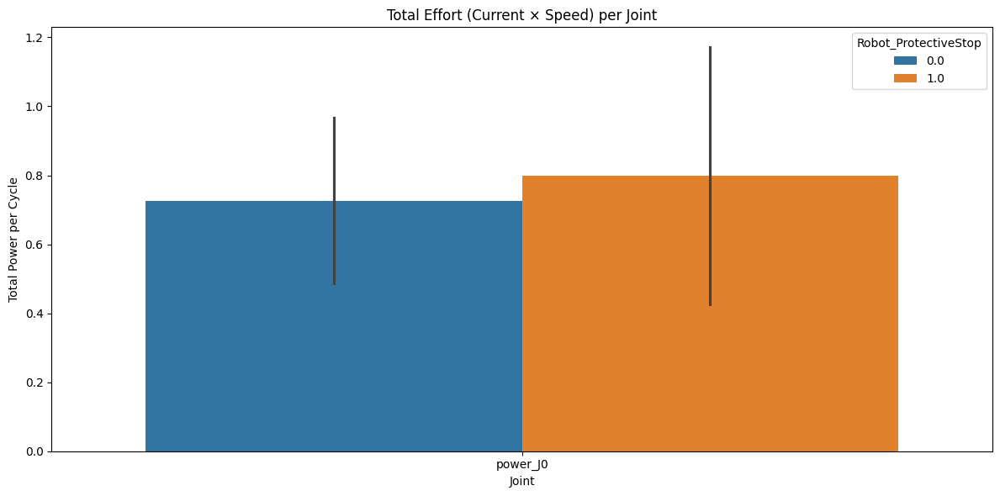

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\1195766569.py:30: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


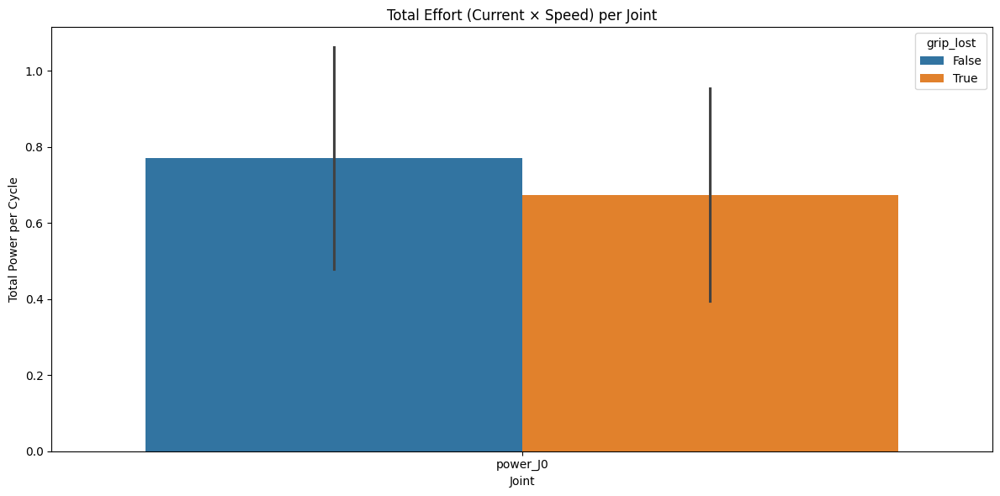

,cycle,grip_lost,joint,total_power
0,1,False,power_J0,0.557104
1,2,True,power_J0,0.598832
2,3,False,power_J0,0.984098
3,4,False,power_J0,0.867700
4,5,True,power_J0,0.652941
...,...,...,...,...
235,260,False,power_J0,0.574445
236,261,False,power_J0,0.651575
237,262,True,power_J0,0.607414
238,263,False,power_J0,0.260167


In [ ]:
def plot_power(df, cycle_col="cycle", stop_col="Robot_ProtectiveStop"):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()
    stop_col = stop_col.strip()

    if cycle_col in df.index.names:
        if cycle_col in df.columns:
            df = df.drop(columns=[cycle_col])
        df = df.reset_index()

    power_cols = [f'power_J{j}' for j in range(6) if f'power_J{j}' in df.columns]
    if not power_cols:
        raise ValueError("No power_J* columns found in dataframe.")

    cycle_power = (
        df.groupby(cycle_col)
          .agg({stop_col: 'max', **{c: 'sum' for c in power_cols}})
          .reset_index()
    )

    long_power = cycle_power.melt(
        id_vars=[cycle_col, stop_col],
        value_vars=power_cols,
        var_name='joint',
        value_name='total_power'
    )

    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=long_power,
        x='joint',
        y='total_power',
        hue=stop_col,
        ci='sd'
    )
    plt.title("Total Effort (Current × Speed) per Joint")
    plt.xlabel("Joint")
    plt.ylabel("Total Power per Cycle")
    plt.tight_layout()
    plt.show()

    return long_power

plot_power(df_joint0_stop_clean)  
plot_power(df_joint0_grip_clean, stop_col="grip_lost")



## General Insights from Speed, sudden , and Power Analysis

- **Speed:** Protective stops occur at **lower speeds**, meaning stops are not caused by fast motions.  
- **Jerk:** Motion abruptness is **not higher** in stop cycles, ruling out jerky movements as the main cause.  
- **Power (Current × Speed):** Protective stops are strongly associated with **higher power usage** in load-bearing joints (J1, J2, J3).  
- **Key takeaway:** Protective stops are primarily related to **mechanical overload and high effort** in critical joints, not motion speed or abruptness.  
- **Practical value:** This guides feature selection when making the ML Model focus on **currents and power** rather than speeds or jerk.  


C:\Users\youss\AppData\Local\Temp\ipykernel_13336\3757392738.py:47: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


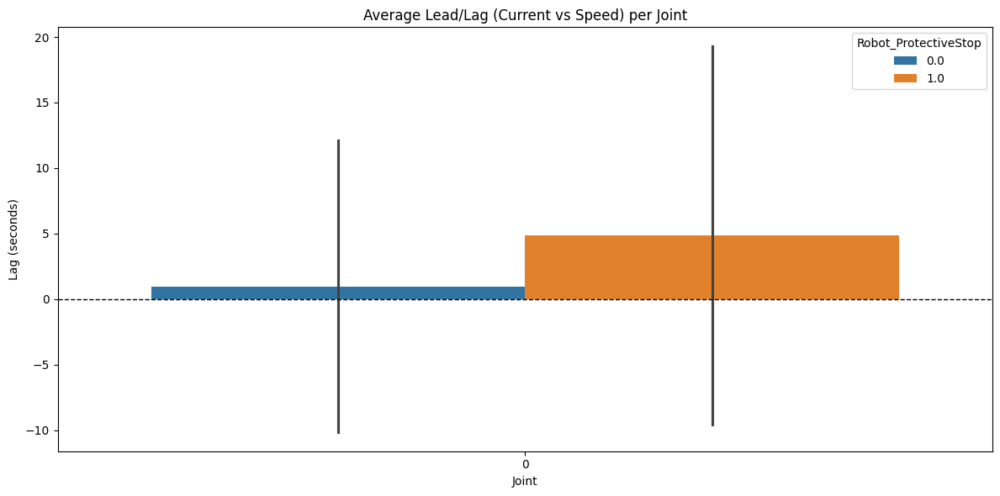

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\3757392738.py:47: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


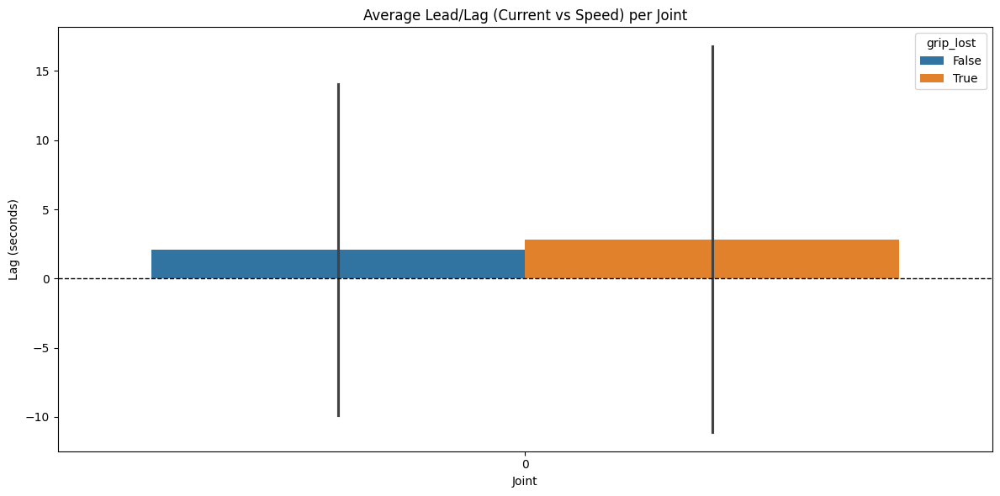

,cycle,joint,lag_samples,lag_s,grip_lost
0,1,0,4,4.0,False
1,2,0,-23,-23.0,True
2,3,0,18,18.0,False
3,4,0,10,10.0,False
4,5,0,-9,-9.0,True
...,...,...,...,...,...
235,260,0,-1,-1.0,False
236,261,0,13,13.0,False
237,262,0,0,0.0,True
238,263,0,7,7.0,False


In [ ]:
def plot_lead_lag(df, cycle_col="cycle", stop_col="Robot_ProtectiveStop", max_lag=40, dt=1.0):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()
    stop_col = stop_col.strip()

    if cycle_col in df.index.names:
        if cycle_col in df.columns:
            df = df.drop(columns=[cycle_col])
        df = df.reset_index()

    def lead_lag(x, y, max_lag=max_lag):
        x = x - x.mean()
        y = y - y.mean()
        corr = correlate(x, y, mode="full")
        lags = np.arange(-len(x) + 1, len(x))
        m = (lags >= -max_lag) & (lags <= max_lag)
        lag = lags[m][corr[m].argmax()]
        return lag

    lag_rows = []
    for cyc, g in df.groupby(cycle_col):
        for j in range(6):
            c, s = f"Current_J{j}", f"Speed_J{j}"
            if c in g and s in g and g[c].notna().sum() and g[s].notna().sum():
                lag_rows.append({
                    "cycle": cyc,
                    "joint": j,
                    "lag_samples": lead_lag(g[c], g[s])
                })

    lags = pd.DataFrame(lag_rows)
    if lags.empty:
        raise ValueError("No valid Current_J* and Speed_J* pairs found in dataframe.")

    lags["lag_s"] = lags["lag_samples"] * dt

    cycle_labels = (
        df.groupby(cycle_col)
          .agg({stop_col: "max"})
          .reset_index()
    )

    lags_labeled = lags.merge(cycle_labels, left_on="cycle", right_on=cycle_col, how="left")

    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=lags_labeled,
        x="joint",
        y="lag_s",
        hue=stop_col,
        ci="sd"
    )
    plt.axhline(0, ls="--", c="k", lw=1)
    plt.title("Average Lead/Lag (Current vs Speed) per Joint")
    plt.xlabel("Joint")
    plt.ylabel("Lag (seconds)")
    plt.tight_layout()
    plt.show()

    return lags_labeled
plot_lead_lag(df_joint0_stop_clean, stop_col="Robot_ProtectiveStop")
plot_lead_lag(df_joint0_grip_clean, stop_col="grip_lost")

### Lead/Lag Between Current and Speed
  
- **Positive lag** means current leads speed (motor effort comes before motion).  
- **Negative lag** means current lags speed (motion happens before current reacts).

**Insights:**
- Joint 0 shows strong **positive lag** during protective stops, meaning it demands current before motion under stress.  
- Other joints (like J4, J5) shift toward **negative lag** in stop cycles, suggesting delayed current response relative to movement.  
- Wide error bars indicate variability across cycles, reflecting unstable dynamics near fault conditions.  

This feature highlights how misalignment between current and speed can be an **early warning indicator** of protective stops.


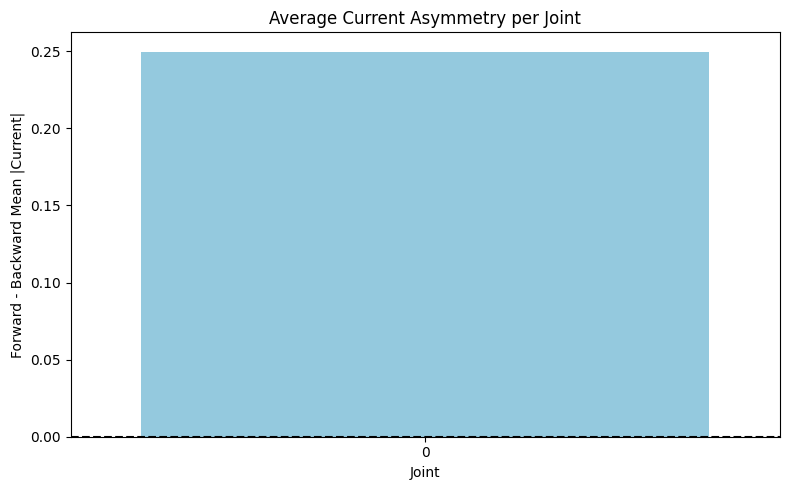

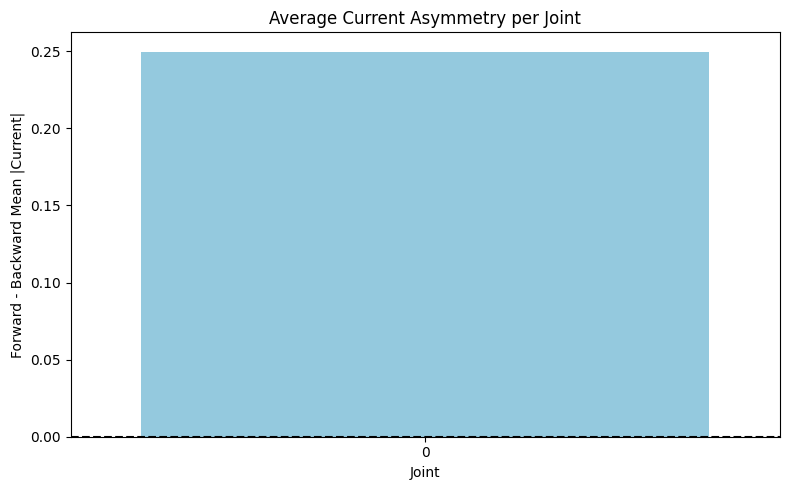

,joint,current_asym
0,0,0.24984


In [ ]:
def plot_current_asymmetry(df, cycle_col="cycle", n_joints=6):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()

    if cycle_col in df.index.names:
        if cycle_col in df.columns:
            df = df.drop(columns=[cycle_col])
        df = df.reset_index()

    asym = []
    for cyc, g in df.groupby(cycle_col):
        for j in range(n_joints):
            c, s = f'Current_J{j}', f'Speed_J{j}'
            if c in g.columns and s in g.columns:
                pos = g.loc[g[s] > 0, c].abs().mean()
                neg = g.loc[g[s] < 0, c].abs().mean()
                asym.append({'cycle': cyc, 'joint': j, 'current_asym': (pos - neg)})

    asym_df = pd.DataFrame(asym)
    if asym_df.empty:
        raise ValueError("No valid Current_J* and Speed_J* pairs found in dataframe.")

    avg_asym = asym_df.groupby('joint')['current_asym'].mean().reset_index()

    plt.figure(figsize=(8, 5))
    sns.barplot(data=avg_asym, x='joint', y='current_asym', color="skyblue")
    plt.axhline(0, ls='--', c='k')
    plt.title("Average Current Asymmetry per Joint")
    plt.ylabel("Forward - Backward Mean |Current|")
    plt.xlabel("Joint")
    plt.tight_layout()
    plt.show()

    return avg_asym
plot_current_asymmetry(df_joint0_stop_clean)
plot_current_asymmetry(df_joint0_grip_clean)

### Current Asymmetry Analysis

- **Positive values** → Forward motion consumes more current.  
- **Negative values** → Backward motion consumes more current.  
- **Near zero** → Symmetric energy usage.

**Key Findings:**
- Joints **J0, J1, J4, J5** show near-symmetric or slightly forward-biased current consumption.  
- Joints **J2 and J3** exhibit **strong negative asymmetry**, indicating that backward motion consumes significantly more current than forward.  
- Such directional bias can reflect **mechanical load imbalance, gravity effects, or friction** in the joint mechanism.



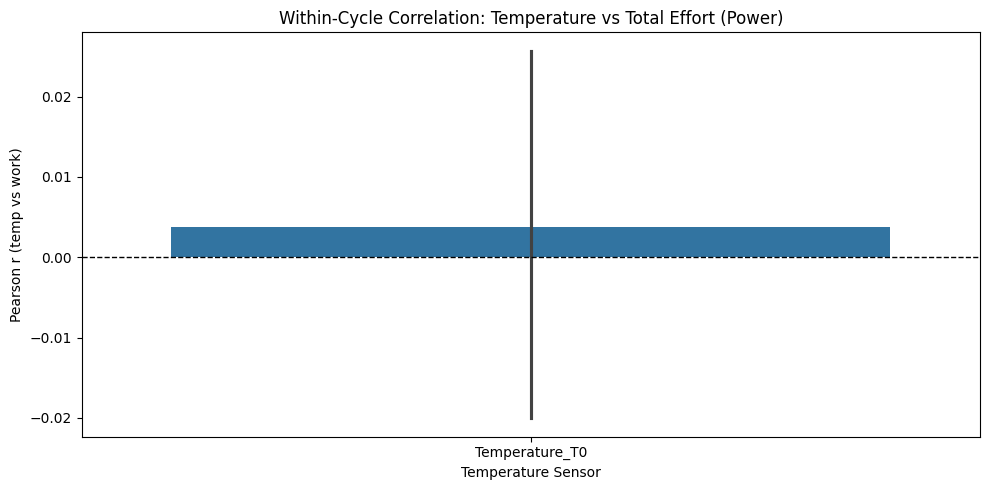

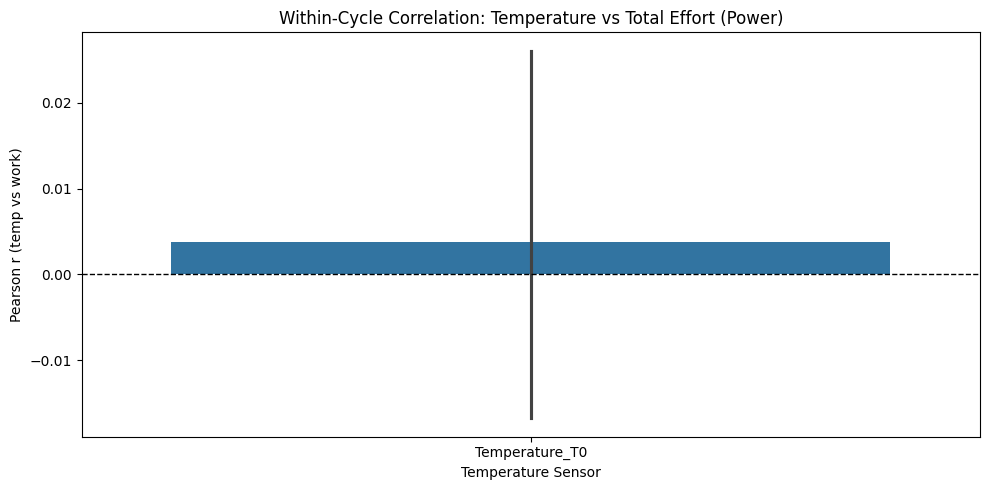

,cycle,sensor,temp_work_corr
0,1,Temperature_T0,-0.281210
1,2,Temperature_T0,-0.317725
2,3,Temperature_T0,-0.062475
3,4,Temperature_T0,-0.119159
4,5,Temperature_T0,0.049858
...,...,...,...
235,260,Temperature_T0,0.363865
236,261,Temperature_T0,0.102172
237,262,Temperature_T0,-0.025635
238,263,Temperature_T0,-0.168726


In [ ]:
def plot_temp_work_corr(df, cycle_col="cycle", temp_cols=None, n_joints=6):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()

    if cycle_col in df.index.names:
        if cycle_col in df.columns:
            df = df.drop(columns=[cycle_col])
        df = df.reset_index()

    if temp_cols is None:
        temp_cols = [c for c in df.columns if c.startswith("Temperature")]

    therm = []
    for cyc, g in df.groupby(cycle_col):
        power_cols = [f'power_J{j}' for j in range(n_joints) if f'power_J{j}' in g.columns]
        if not power_cols:
            continue
        w = g[power_cols].sum(axis=1)
        for t in temp_cols:
            if t in g.columns:
                r = g[[t]].join(w.rename('work'))
                corr_val = r.corr().iloc[0, 1]
                therm.append({'cycle': cyc, 'sensor': t, 'temp_work_corr': corr_val})

    therm_df = pd.DataFrame(therm)
    if therm_df.empty:
        raise ValueError("No valid Temperature and Power columns found.")

    plt.figure(figsize=(10, 5))
    sns.barplot(data=therm_df, x='sensor', y='temp_work_corr')
    plt.axhline(0, ls='--', c='k', lw=1)
    plt.title('Within-Cycle Correlation: Temperature vs Total Effort (Power)')
    plt.ylabel('Pearson r (temp vs work)')
    plt.xlabel('Temperature Sensor')
    plt.tight_layout()
    plt.show()

    return therm_df
plot_temp_work_corr(df_joint0_stop_clean, cycle_col="cycle")
plot_temp_work_corr(df_joint0_grip_clean, cycle_col="cycle")


### Within Cycle Temperature Power Correlation

- This plot shows the **correlation between temperature and total effort (power) within the same cycle**.  
- The correlations are **very close to zero**, with some small negative values (e.g., J1, J2).  
- This means that **temperature does not respond instantly to changes in work** instead, heating builds up gradually over time.  
- The large error bars (overlapping zero) show that the relationship is **inconsistent across cycles**.  


d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: in

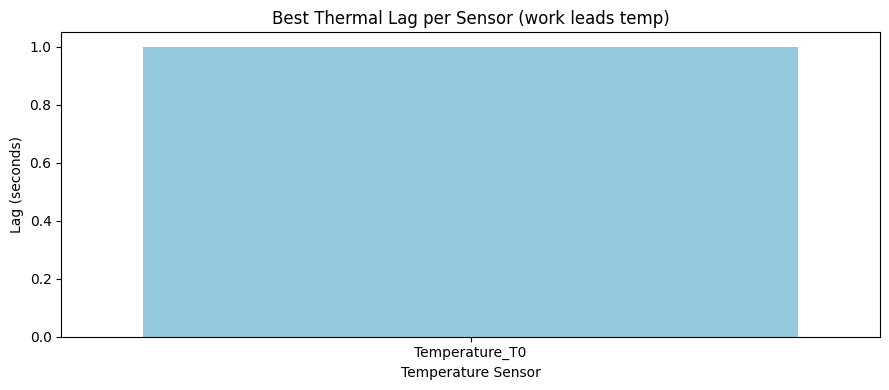

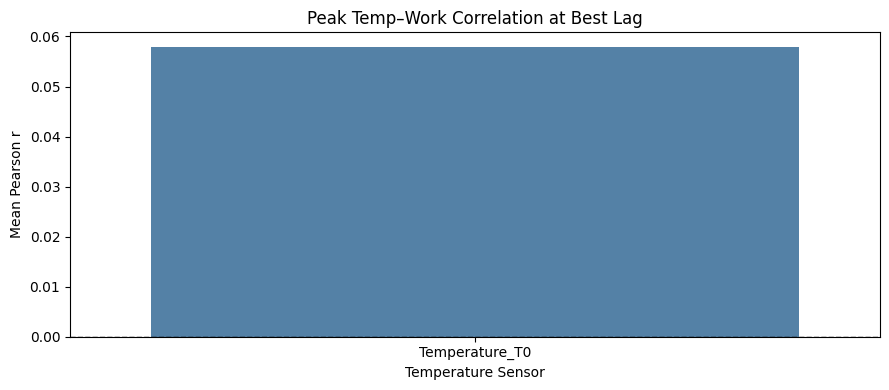

d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
d:\Robo-Fault\venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: in

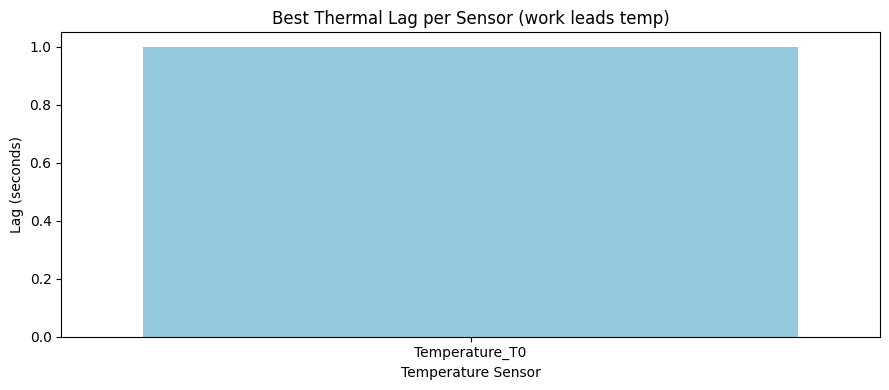

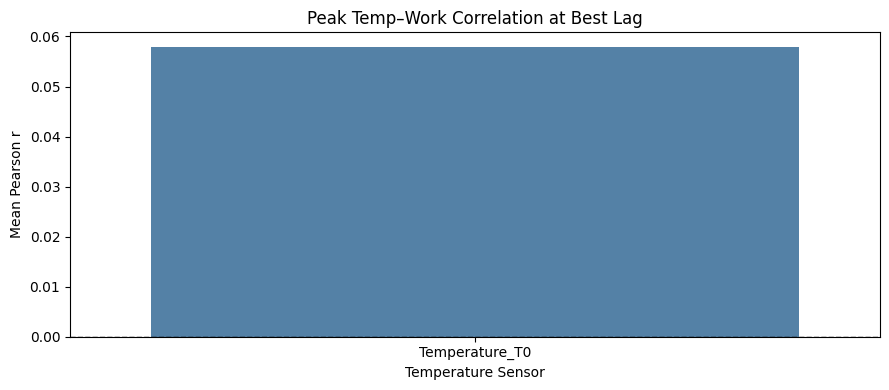

,sensor,lag,corr
0,Temperature_T0,1,0.057929


In [ ]:
def plot_best_thermal_lag(df, cycle_col="cycle", temp_cols=None, n_joints=6, max_lag=10):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()

    if cycle_col in df.index.names:
        if cycle_col in df.columns:
            df = df.drop(columns=[cycle_col])
        df = df.reset_index()

    if temp_cols is None:
        temp_cols = [c for c in df.columns if c.startswith("Temperature")]

    def lagged_corr(temp, work, max_lag=max_lag):
        results = {}
        for lag in range(0, max_lag + 1):
            corr = temp.corr(work.shift(lag))
            results[lag] = corr
        return results

    lagged_results = []

    for cyc, g in df.groupby(cycle_col):
        power_cols = [f'power_J{j}' for j in range(n_joints) if f'power_J{j}' in g.columns]
        if not power_cols:
            continue
        work = g[power_cols].sum(axis=1)
        for t in temp_cols:
            if t in g.columns:
                lags = lagged_corr(g[t], work, max_lag=max_lag)
                for lag, corr in lags.items():
                    lagged_results.append({
                        'cycle': cyc,
                        'sensor': t,
                        'lag': lag,
                        'corr': corr
                    })

    lagged_df = pd.DataFrame(lagged_results)
    if lagged_df.empty:
        raise ValueError("No valid Temperature and Power columns found.")

    avg = (lagged_df
           .dropna(subset=['corr'])
           .groupby(['sensor', 'lag'])['corr']
           .mean()
           .reset_index())

    idx = avg.groupby('sensor')['corr'].idxmax()
    best = avg.loc[idx].sort_values('sensor').reset_index(drop=True)

    plt.figure(figsize=(9, 4))
    sns.barplot(data=best, x='sensor', y='lag', color='skyblue')
    plt.title('Best Thermal Lag per Sensor (work leads temp)')
    plt.ylabel('Lag (seconds)')
    plt.xlabel('Temperature Sensor')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(9, 4))
    sns.barplot(data=best, x='sensor', y='corr', color='steelblue')
    plt.axhline(0, ls='--', c='k', lw=1)
    plt.title('Peak Temp–Work Correlation at Best Lag')
    plt.ylabel('Mean Pearson r')
    plt.xlabel('Temperature Sensor')
    plt.tight_layout()
    plt.show()

    return best
plot_best_thermal_lag(df_joint0_stop_clean, cycle_col="cycle")
plot_best_thermal_lag(df_joint0_grip_clean, cycle_col="cycle")

####  Best Thermal Lag per Sensor
- The bar plot shows the **time delay (lag)** in seconds where the correlation between *work* and *temperature* is strongest.  
- Example:
  - **Temperature_J2** responds fastest (~2s lag).  
  - **Temperature_J4 & J5** respond much slower (~10s lag).  
  - **Temperature_T0** has almost no lag (~1s), meaning it reacts very quickly.  

This indicates that different sensors heat up at different speeds, with some (J4, J5) being much slower to reflect workload.

#### Peak Temp Work Correlation at Best Lag
  - **Temperature_T0** shows the strongest correlation (~0.20), meaning it is the most reliable  for effort.  
  - Other sensors (J1–J5) show weaker correlations (<0.07), meaning their thermal response is less tied to immediate workload.  

These results highlight **T0 as the most sensitive sensor**, while joints J4/J5 are slow and less informative for direct workload monitoring.  


C:\Users\youss\AppData\Local\Temp\ipykernel_13336\2117298949.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


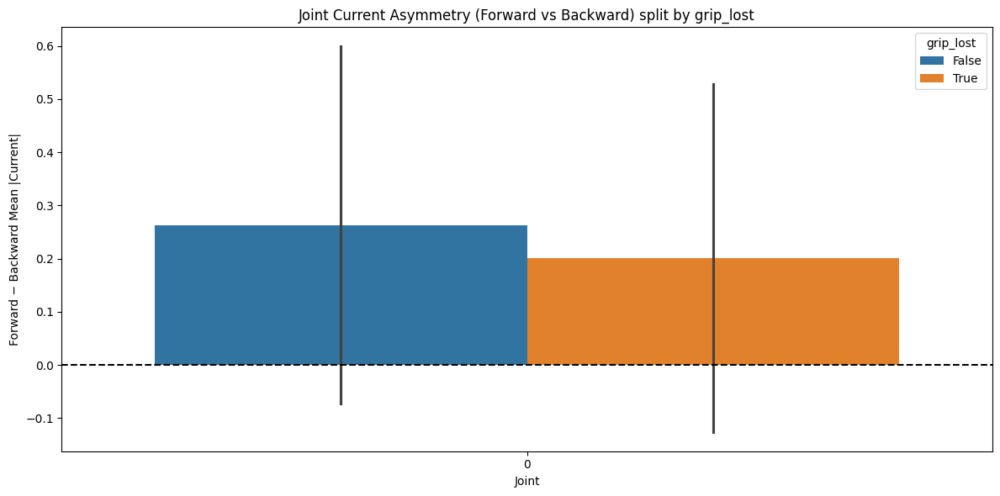

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\2117298949.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(


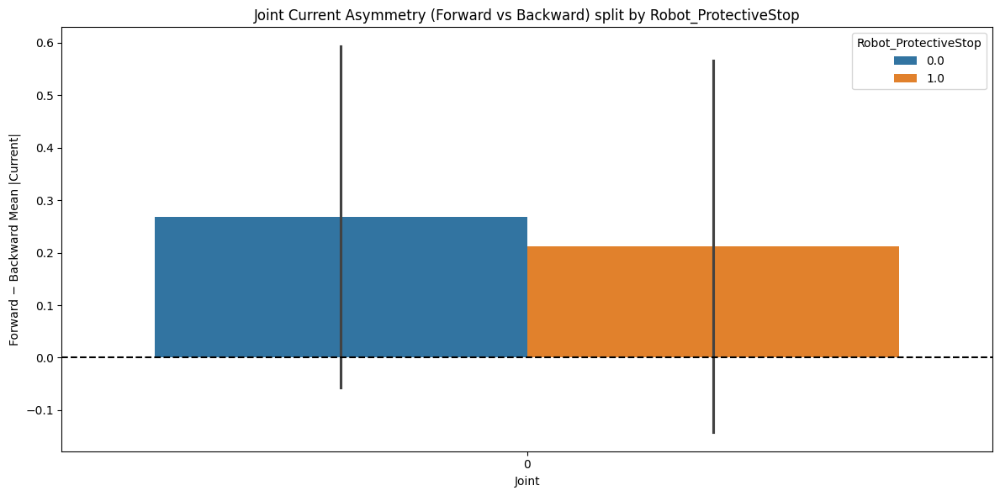

,cycle,joint,current_asym,Robot_ProtectiveStop
0,1,0,0.195304,1.0
1,2,0,0.116321,0.0
2,3,0,0.271364,0.0
3,4,0,0.684365,0.0
4,5,0,0.575905,0.0
...,...,...,...,...
235,260,0,0.234133,1.0
236,261,0,0.324617,1.0
237,262,0,-0.099329,0.0
238,263,0,-0.239022,0.0


In [ ]:
def plot_asymmetry_with_grip(df, cycle_col="cycle", stop_col="grip_lost", n_joints=6):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()
    stop_col = stop_col.strip()

    if cycle_col in df.index.names:
        if cycle_col in df.columns:
            df = df.drop(columns=[cycle_col])
        df = df.reset_index()

    asym_list = []
    for cyc, g in df.groupby(cycle_col):
        for j in range(n_joints):
            c, s = f'Current_J{j}', f'Speed_J{j}'
            if c in g.columns and s in g.columns:
                pos = g.loc[g[s] > 0, c].abs().mean()
                neg = g.loc[g[s] < 0, c].abs().mean()
                asym_list.append({'cycle': cyc, 'joint': j, 'current_asym': (pos - neg)})

    if not asym_list:
        raise ValueError("No valid Current and Speed columns found.")

    asym_df = pd.DataFrame(asym_list)

    labels = (
        df.groupby(cycle_col)
          .agg(**{stop_col: (stop_col, 'max')})
          .reset_index()
    )

    asym_labeled = asym_df.merge(labels, left_on='cycle', right_on=cycle_col, how='left')

    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=asym_labeled,
        x='joint',
        y='current_asym',
        hue=stop_col,
        ci='sd'
    )
    plt.axhline(0, color='black', linestyle='--')
    plt.title(f"Joint Current Asymmetry (Forward vs Backward) split by {stop_col}")
    plt.xlabel("Joint")
    plt.ylabel("Forward − Backward Mean |Current|")
    plt.tight_layout()
    plt.show()

    return asym_labeled
plot_asymmetry_with_grip(df_joint0_grip_clean, cycle_col="cycle ", stop_col="grip_lost")
plot_asymmetry_with_grip(df_joint0_stop_clean,cycle_col="cycle ", stop_col="Robot_ProtectiveStop")


### Current Asymmetry (Forward vs Backward Motion)


**Key Findings:**
- **Joints 0 and 1**: Forward motion requires more current. This effect is stronger in cycles where grip was lost, suggesting additional strain in forward movement during failures.  
- **Joints 2 and 3**: Backward motion consumes more current, especially J3. Grip-loss cycles amplify this effect, indicating resistance when retracting the gripper.  
- **Joints 4 and 5**: Show little to no asymmetry, meaning they are less affected by grip conditions.  
- **Grip Loss Impact**: Cycles with grip loss consistently show **greater asymmetry**, highlighting it as a potential early warning indicator for anomalies.



# Some Time Series Analysis

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3844143565.py:11: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if pd.api.types.is_datetime64tz_dtype(df["Timestamp"]):
C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3844143565.py:19: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if "cycle" in df.columns and pd.api.types.is_datetime64tz_dtype(df["cycle"]):
C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3844143565.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


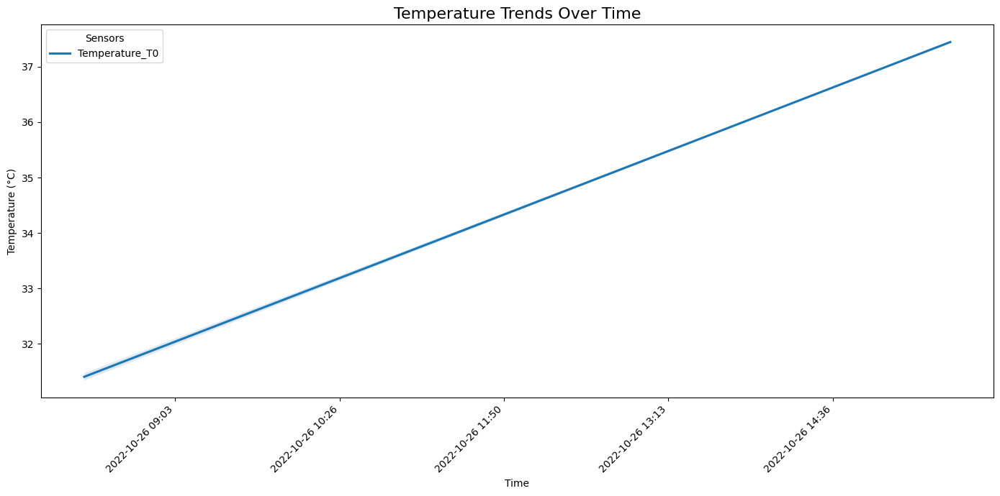

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3844143565.py:11: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if pd.api.types.is_datetime64tz_dtype(df["Timestamp"]):
C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3844143565.py:19: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if "cycle" in df.columns and pd.api.types.is_datetime64tz_dtype(df["cycle"]):
C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3844143565.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


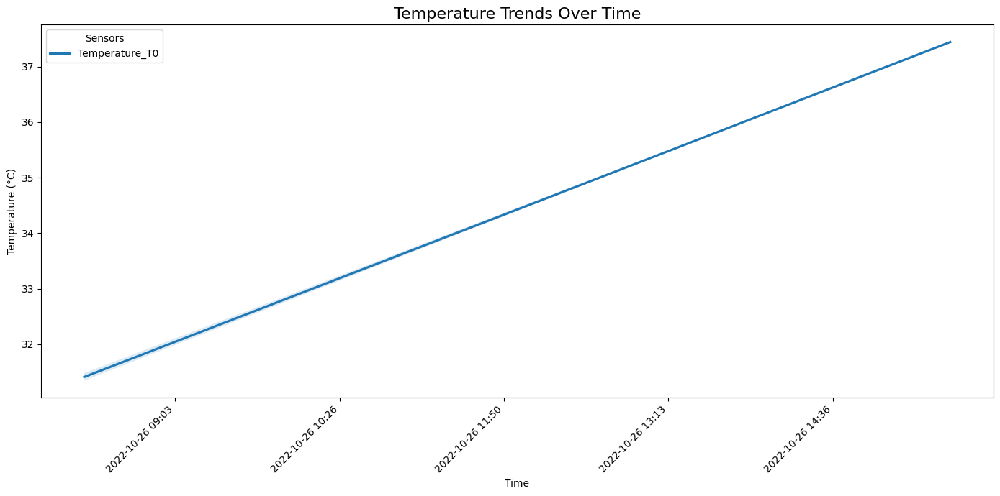

In [57]:
def temp_trend_over_time(df):
    

    df = df.copy()
    df.columns = df.columns.str.strip()

    if "Timestamp" not in df.columns:
        raise ValueError("DataFrame must contain a 'Timestamp' column.")

   
    if pd.api.types.is_datetime64tz_dtype(df["Timestamp"]):
       
        df["Timestamp"] = df["Timestamp"].dt.tz_convert("UTC").dt.tz_localize(None)
    elif not pd.api.types.is_datetime64_any_dtype(df["Timestamp"]):
        df["Timestamp"] = pd.to_datetime(df["Timestamp"], errors="coerce")
    df = df.dropna(subset=["Timestamp"])

    
    if "cycle" in df.columns and pd.api.types.is_datetime64tz_dtype(df["cycle"]):
        df["cycle"] = df["cycle"].dt.tz_localize(None)

    temp_cols = [c for c in df.columns if "temp" in c.lower()]
    if not temp_cols:
        raise ValueError("No columns containing 'temp' found.")

    
    x_seconds = df["Timestamp"].astype("int64") // 10**9

    plt.figure(figsize=(14, 7))
    for col in temp_cols:
        sns.regplot(
            x=x_seconds,
            y=df[col],
            scatter=False,
            label=col
        )

    plt.title("Temperature Trends Over Time", fontsize=16)
    plt.xlabel("Time")
    plt.ylabel("Temperature (°C)")
    plt.legend(title="Sensors")

    
    ax = plt.gca()
    ticks = ax.get_xticks()
    ax.set_xticklabels(
        pd.to_datetime(ticks, unit="s").strftime("%Y-%m-%d %H:%M"),
        rotation=45,
        ha="right"
    )

    plt.tight_layout()
    plt.show()

temp_trend_over_time(df_joint0_stop_clean)
temp_trend_over_time(df_joint0_grip_clean)    

In [ ]:
def duration(df,column_name,value):
    lost_df = df[df[column_name]== value].copy()

    lost_df["group"] = (lost_df["Timestamp"].diff().dt.seconds > 1).cumsum()

    summary = lost_df.groupby("group").agg(
        start_time=("Timestamp", "min"),
        end_time=("Timestamp", "max"),
        duration=("Timestamp", lambda x: (x.max() - x.min()).total_seconds()),
        avg_speed=("Speed_J0", "mean"),  
        avg_temp=("Temperature_T0", "mean"),  
        avg_current=("Current_J0", "mean")   
    ).reset_index(drop=True)

    top5 = summary.sort_values("duration", ascending=False).head(5)

    return top5


,start_time,end_time,duration,avg_speed,avg_temp,avg_current
52,2022-10-26 14:20:09.423000+00:00,2022-10-26 14:36:13.183000+00:00,963.760,0.000631,36.320647,-0.052858
9,2022-10-26 08:24:25.936000+00:00,2022-10-26 08:30:38.730000+00:00,372.794,0.002828,29.929940,-0.028042
109,2022-10-26 15:20:25.153000+00:00,2022-10-26 15:25:48.015000+00:00,322.862,-0.000388,37.195458,-0.044301
115,2022-10-26 15:29:40.364000+00:00,2022-10-26 15:34:35.025000+00:00,294.661,-0.009722,37.137543,-0.080494
55,2022-10-26 14:38:43.942000+00:00,2022-10-26 14:42:58.389000+00:00,254.447,0.001532,36.761319,-0.113268


In [ ]:
duration(df_joint0_grip_clean,"grip_lost",1)  

,start_time,end_time,duration,avg_speed,avg_temp,avg_current
1,2022-10-26 08:18:19.192000+00:00,2022-10-26 08:18:37.264000+00:00,18.072,-0.012028,28.039474,-0.063255
7,2022-10-26 08:24:08.854000+00:00,2022-10-26 08:24:24.921000+00:00,16.067,0.026114,29.316176,-0.018215
62,2022-10-26 15:06:48.637000+00:00,2022-10-26 15:06:58.692000+00:00,10.055,0.009863,37.068182,0.600093
3,2022-10-26 08:20:18.742000+00:00,2022-10-26 08:20:28.786000+00:00,10.044,-0.018587,28.426136,-0.026539
6,2022-10-26 08:23:51.792000+00:00,2022-10-26 08:24:00.822000+00:00,9.030,-0.047398,29.225000,-0.001913


In [ ]:
duration(df_joint0_grip_clean,"grip_lost",0)  

,start_time,end_time,duration,avg_speed,avg_temp,avg_current
52,2022-10-26 14:20:09.423000+00:00,2022-10-26 14:36:13.183000+00:00,963.760,0.000631,36.320647,-0.052858
9,2022-10-26 08:24:25.936000+00:00,2022-10-26 08:30:38.730000+00:00,372.794,0.002828,29.929940,-0.028042
109,2022-10-26 15:20:25.153000+00:00,2022-10-26 15:25:48.015000+00:00,322.862,-0.000388,37.195458,-0.044301
115,2022-10-26 15:29:40.364000+00:00,2022-10-26 15:34:35.025000+00:00,294.661,-0.009722,37.137543,-0.080494
55,2022-10-26 14:38:43.942000+00:00,2022-10-26 14:42:58.389000+00:00,254.447,0.001532,36.761319,-0.113268


In [ ]:
duration(df_joint0_stop_clean,"Robot_ProtectiveStop",1)  

,start_time,end_time,duration,avg_speed,avg_temp,avg_current
21,2022-10-26 14:21:07.769000+00:00,2022-10-26 14:21:18.843000+00:00,11.074,0.000053,36.000000,-0.097245
17,2022-10-26 09:03:09.280000+00:00,2022-10-26 09:03:19.345000+00:00,10.065,0.000008,34.295455,-0.138361
7,2022-10-26 08:41:43.361000+00:00,2022-10-26 08:41:52.413000+00:00,9.052,-0.012401,32.075000,0.011554
30,2022-10-26 14:35:40.996000+00:00,2022-10-26 14:35:47.031000+00:00,6.035,-0.000134,36.625000,0.040766
59,2022-10-26 15:05:23.176000+00:00,2022-10-26 15:05:28.203000+00:00,5.027,0.000102,37.062500,0.186421


In [ ]:
duration(df_joint0_stop_clean,"Robot_ProtectiveStop",0)  

,start_time,end_time,duration,avg_speed,avg_temp,avg_current
2,2022-10-26 08:17:55.055000+00:00,2022-10-26 08:23:33.748000+00:00,338.693,0.001959,28.502774,-0.026435
43,2022-10-26 14:26:16.767000+00:00,2022-10-26 14:30:32.271000+00:00,255.504,0.003106,36.350735,-0.021201
4,2022-10-26 08:27:01.705000+00:00,2022-10-26 08:30:38.730000+00:00,217.025,0.006383,30.173387,0.010699
3,2022-10-26 08:23:35.750000+00:00,2022-10-26 08:26:58.687000+00:00,202.937,-0.003988,29.501847,-0.057344
15,2022-10-26 08:43:27.954000+00:00,2022-10-26 08:46:39.093000+00:00,191.139,-0.000648,32.510144,-0.058547


In [ ]:
def tool_current_across_cycles(df, stop_col="Robot_ProtectiveStop"):
    df = df.copy()
    df.columns = df.columns.str.strip()
    stop_col = stop_col.strip()

    if stop_col not in df.columns:
        stop_col = None

    if 'cycle' in df.index.names:
        if 'cycle' in df.columns:
            df = df.reset_index(drop=True)
        else:
            df = df.reset_index()

    if pd.api.types.is_datetime64tz_dtype(df['cycle']):
        df['cycle'] = df['cycle'].dt.tz_localize(None)

    agg_dict = {'tool_current_mean': ('Tool_current', 'mean'),
                'tool_current_max': ('Tool_current', 'max')}
    if stop_col:
        agg_dict.update({'protective': (stop_col, 'max')})

    if 'grip_lost' in df.columns:
        agg_dict.update({'grip': ('grip_lost', 'max')})

    cycle_stats = df.groupby('cycle').agg(**agg_dict).reset_index()

    plt.figure(figsize=(15,6))
    plt.plot(cycle_stats['cycle'], cycle_stats['tool_current_mean'], label="Mean Tool Current", color="blue")
    plt.plot(cycle_stats['cycle'], cycle_stats['tool_current_max'], label="Max Tool Current", color="red")

    if stop_col:
        plt.scatter(cycle_stats['cycle'][cycle_stats['protective']==1],
                    cycle_stats['tool_current_mean'][cycle_stats['protective']==1],
                    color="black", marker="x", label=stop_col)
    if 'grip' in cycle_stats.columns:
        plt.scatter(cycle_stats['cycle'][cycle_stats['grip']==1],
                    cycle_stats['tool_current_mean'][cycle_stats['grip']==1],
                    color="orange", marker="o", label="Grip Lost")

    plt.title("Tool Current Across Cycles with Faults")
    plt.xlabel("Cycle"); plt.ylabel("Tool Current")
    plt.legend(); plt.tight_layout()
    plt.show()


C:\Users\youss\AppData\Local\Temp\ipykernel_13336\1950182356.py:15: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if pd.api.types.is_datetime64tz_dtype(df['cycle']):


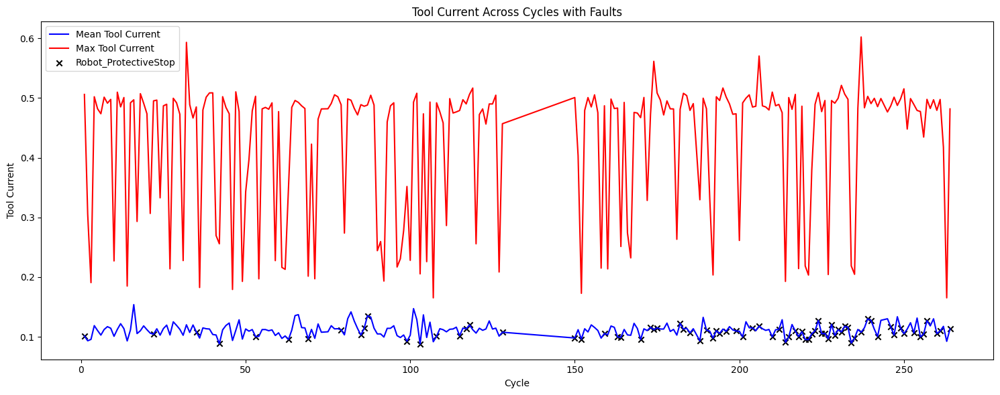

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\1950182356.py:15: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if pd.api.types.is_datetime64tz_dtype(df['cycle']):


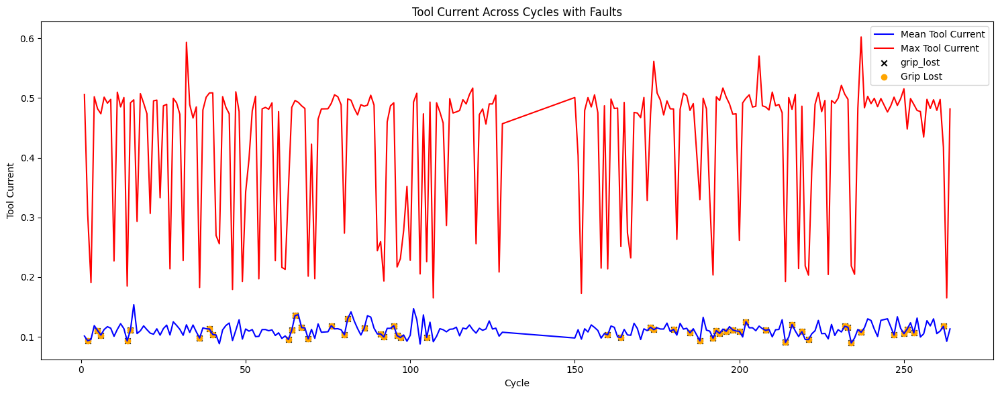

In [ ]:
tool_current_across_cycles(df_joint0_stop_clean, stop_col="Robot_ProtectiveStop")
tool_current_across_cycles(df_joint0_grip_clean, stop_col="grip_lost")


# Cycle-Level Tool Current Analysis

###  Key Insights
1. **Stable Mean Current**  
   - The robot’s baseline effort  is consistent across cycles (~0.1).  
   - Suggests that normal operation load is stable.  

2. **Spikes in Max Current**  
   - Red peaks (~0.6) indicate cycles with sudden extra effort.  
     

3. **Protective Stop Correlation**  
   - cluster near cycles with **high max current peaks**.  
   - Confirms that **protective stops are triggered by overloads**.  

4. **Grip Loss Independence**  
   - appears even when mean current is **normal or low**.  
   - Suggests grip failures are **not caused by overload**, but by mechanical gripping issues.  

5. **Different Fault Modes**  
   - **Protective Stops Overload / high current demand.**  
   - **Grip Loss End effector or object handling failure.**  

 


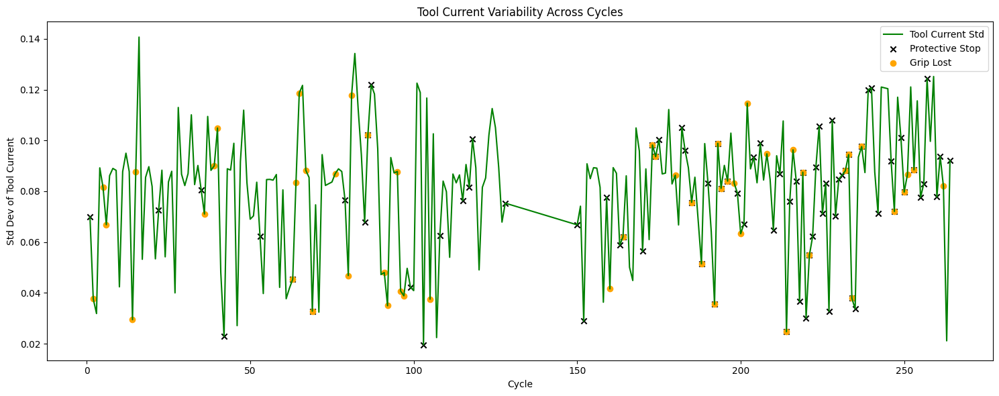

In [ ]:
cycle_stats['tool_current_std'] = df_missforest.groupby('cycle ')['Tool_current'].std().values

plt.figure(figsize=(15,6))
plt.plot(cycle_stats['cycle '], cycle_stats['tool_current_std'], label="Tool Current Std", color="green")
plt.scatter(cycle_stats['cycle '][cycle_stats['protective']==1],
            cycle_stats['tool_current_std'][cycle_stats['protective']==1], color="black", marker="x", label="Protective Stop")
plt.scatter(cycle_stats['cycle '][cycle_stats['grip']==1],
            cycle_stats['tool_current_std'][cycle_stats['grip']==1], color="orange", marker="o", label="Grip Lost")
plt.title("Tool Current Variability Across Cycles")
plt.xlabel("Cycle"); plt.ylabel("Std Dev of Tool Current")
plt.legend(); plt.tight_layout(); plt.show()


### Tool Current Variability Across Cycles

This plot shows the standard deviation of the tool current per cycle.

**Insights:**
- **High variability cycles (spikes in std):** Indicate unstable tool current. Many faults occur here.
- **Low variability cycles:** Usually stable operation, but protective stops still occur.
- **Fault correlation:** Both Protective Stops and Grip Loss events align with cycles of **increased current fluctuations**, suggesting that instability is a strong fault indicator.



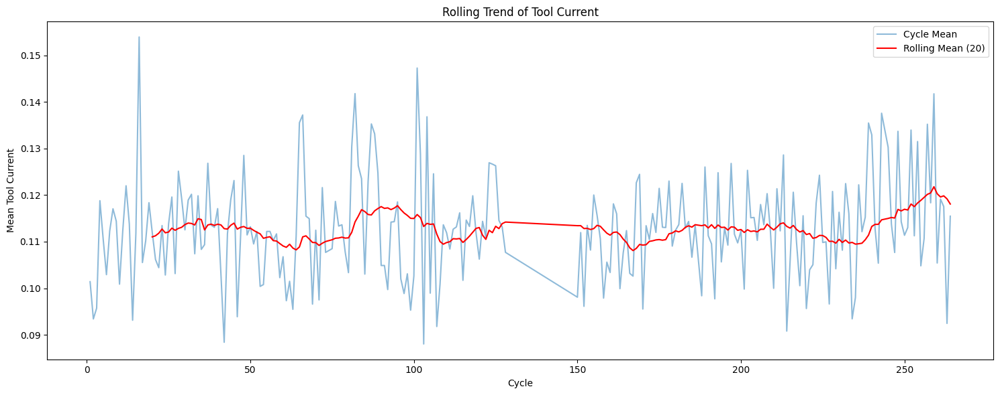

In [ ]:
window = 20
cycle_stats['roll_mean'] = cycle_stats['tool_current_mean'].rolling(window).mean()

plt.figure(figsize=(15,6))
plt.plot(cycle_stats['cycle '], cycle_stats['tool_current_mean'], alpha=0.5, label="Cycle Mean")
plt.plot(cycle_stats['cycle '], cycle_stats['roll_mean'], color="red", label=f"Rolling Mean ({window})")
plt.title("Rolling Trend of Tool Current")
plt.xlabel("Cycle");
plt.ylabel("Mean Tool Current")
plt.legend();
plt.tight_layout();
plt.show()


### Rolling Trend of Tool Current

The plot shows the mean tool current per cycle and its rolling mean over a 20-cycle window.

- **(Cycle Mean):** Reflects the average tool current at each cycle. It is noisy and shows short term fluctuations.  
- **(Rolling Mean):** A smoothed curve that averages over 20 cycles, highlighting the long term trend and filtering out noise.  

**Insights:**  
- The rolling mean is less noisy, indicating that the tool’s energy usage (current demand) is stable across cycles.  
- Small local variations in the red line.    


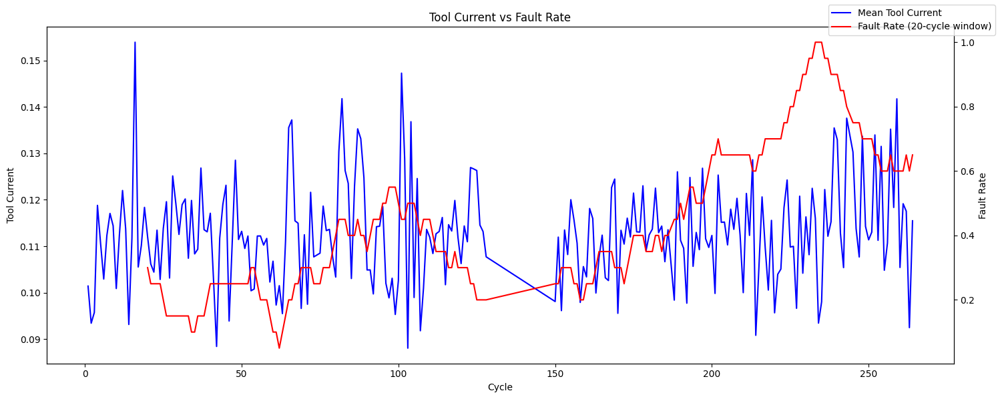

In [ ]:
cycle_stats['fault'] = cycle_stats['protective'] | cycle_stats['grip']
fault_rate = cycle_stats['fault'].rolling(20).mean()

fig, ax1 = plt.subplots(figsize=(15,6))
ax1.plot(cycle_stats['cycle '], cycle_stats['tool_current_mean'], color="blue", label="Mean Tool Current")
ax2 = ax1.twinx()
ax2.plot(cycle_stats['cycle '], fault_rate, color="red", label="Fault Rate (20-cycle window)")

ax1.set_xlabel("Cycle")
ax1.set_ylabel("Tool Current")
ax2.set_ylabel("Fault Rate")
plt.title("Tool Current vs Fault Rate")
fig.legend(loc="upper right")
plt.tight_layout(); plt.show()


### Tool Current vs Fault Rate (Time Series Analysis)

This plot compares the **mean tool current per cycle**  with the **rolling fault rate** (smoothed over a 20-cycle window).  

**Key insights:**
- Periods of **high fault rate** can be spotted even when tool current stays stable.
- If **current increases alongside fault rate**, it suggests the tool is under higher stress, contributing to failures.
- Around **cycles 180–240**, fault rates increase sharply while tool current remains stable, highlighting fault causes unrelated to current draw.



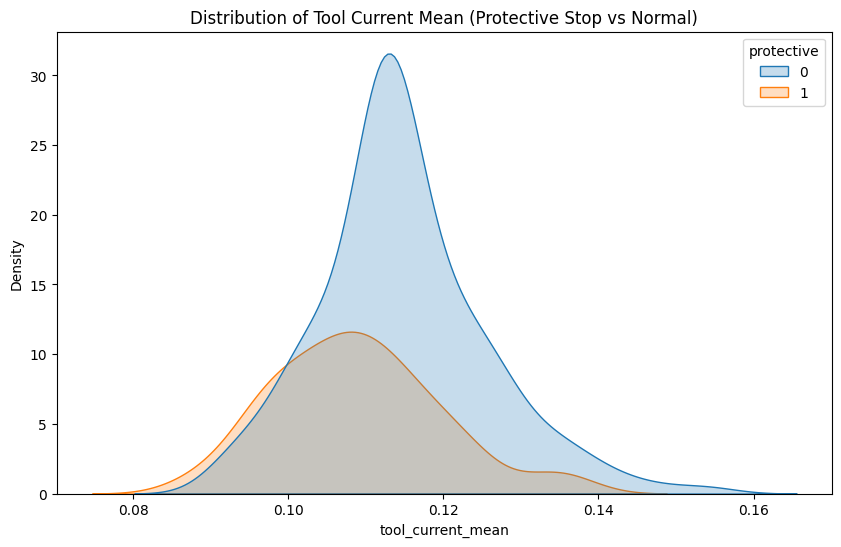

In [ ]:
plt.figure(figsize=(10,6))
sns.kdeplot(data=cycle_stats, x='tool_current_mean', hue='protective', fill=True)
plt.title("Distribution of Tool Current Mean (Protective Stop vs Normal)")
plt.show()


### Distribution of Tool Current Mean (Protective Stop vs Normal)

The KDE plot compares the distribution of **mean tool current per cycle** between:
- **Normal cycles (0):** More concentrated around ~0.11 .
- **Protective stop cycles (1):** Slightly shifted, broader distribution.

**Insights:**
- Protective stops are **not strongly tied to very high  tool current** but may happen under slightly lower or more variable tool current conditions.
- This indicates that protective stops could be triggered by **other factors** rather than tool current load alone.


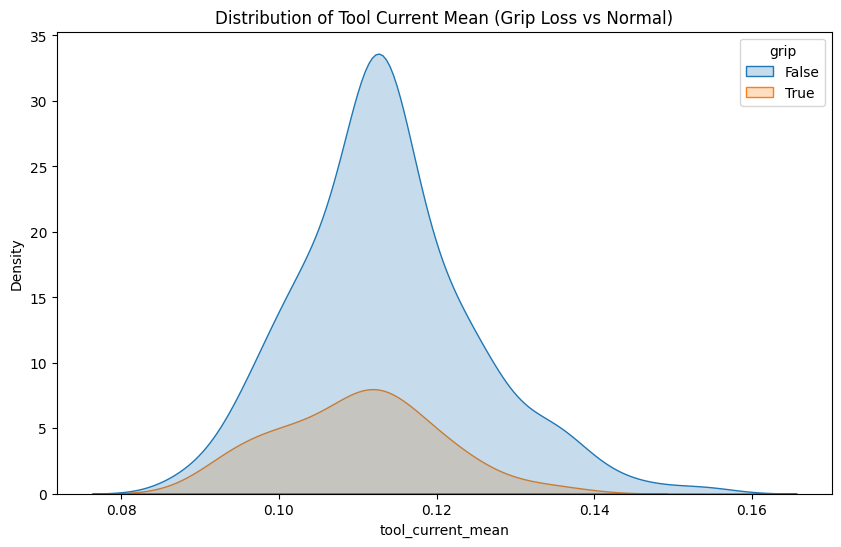

In [ ]:
plt.figure(figsize=(10,6))
sns.kdeplot(data=cycle_stats, x='tool_current_mean', hue='grip', fill=True)
plt.title("Distribution of Tool Current Mean (Grip Loss vs Normal)")
plt.show()


### Distribution of Tool Current Mean (Grip Loss vs Normal)

The KDE plot compares **mean tool current per cycle** between:
- **Normal cycles (False):** Centered around ~0.11 with a strong peak.
- **Grip loss cycles (True):** Overlapping heavily with normal cycles, also centered near ~0.11.

**Insights:**
- Grip loss does **not appear strongly correlated with mean tool current**.
- This suggests that other features  are likely more important in explaining grip loss events.


C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3954104255.py:15: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if pd.api.types.is_datetime64tz_dtype(df[cycle_col]):


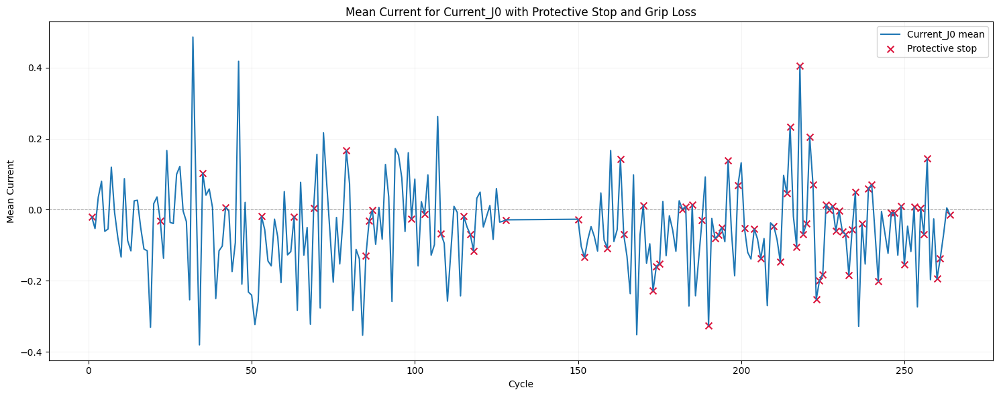

C:\Users\FH\AppData\Local\Temp\ipykernel_27292\3954104255.py:15: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if pd.api.types.is_datetime64tz_dtype(df[cycle_col]):


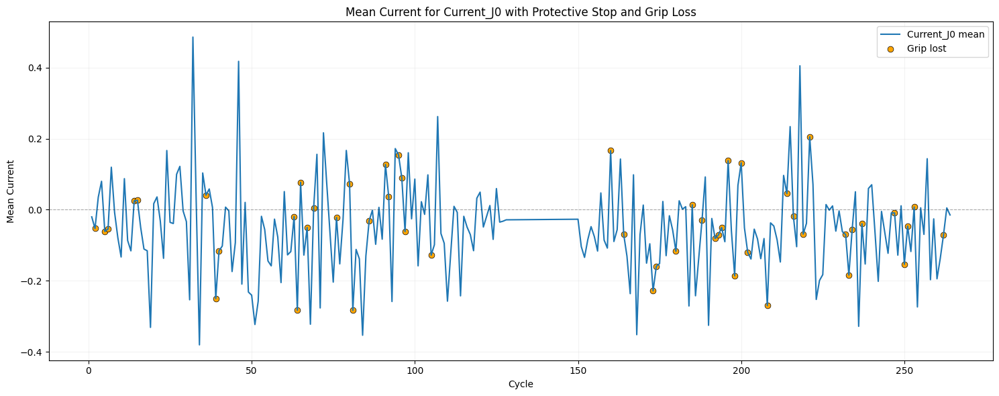

,cycle,Current_J0,grip_lost
0,1,-0.020017,False
1,2,-0.052927,True
2,3,0.035297,False
3,4,0.080079,False
4,5,-0.060776,True
5,6,-0.054206,True
6,7,0.119701,False
7,8,-0.007537,False
8,9,-0.078879,False
9,10,-0.133013,False


In [58]:
def plot_single_joint_current(df, joint=0, joint_prefix="Current_J", cycle_col="cycle",
                              prot_col="Robot_ProtectiveStop", grip_col="grip_lost"):
    df = df.copy()
    df.columns = df.columns.str.strip()
    cycle_col = cycle_col.strip()
    prot_col = prot_col.strip()
    grip_col = grip_col.strip()
    
    if cycle_col in df.index.names:
        if cycle_col in df.columns:
            df = df.reset_index(drop=True)
        else:
            df = df.reset_index()

    if pd.api.types.is_datetime64tz_dtype(df[cycle_col]):
        df[cycle_col] = df[cycle_col].dt.tz_localize(None)

    col = f"{joint_prefix}{joint}"
    if col not in df.columns:
        raise ValueError(f"{col} not found in dataframe")

    agg_dict = {col: "mean"}
    if prot_col in df.columns:
        agg_dict[prot_col] = "max"
    if grip_col in df.columns:
        agg_dict[grip_col] = "max"

    cycle_means = df.groupby(cycle_col).agg(agg_dict).reset_index()

    prot_mask = cycle_means[prot_col].astype(bool) if prot_col in cycle_means.columns else np.array([False]*len(cycle_means))
    grip_mask = cycle_means[grip_col].astype(bool) if grip_col in cycle_means.columns else np.array([False]*len(cycle_means))

    plt.figure(figsize=(15,6))
    plt.plot(cycle_means[cycle_col], cycle_means[col], lw=1.5, label=f"{col} mean")

    if prot_col in cycle_means.columns:
        plt.scatter(cycle_means[cycle_col][prot_mask], cycle_means[col][prot_mask],
                    color="crimson", marker="x", s=50, label="Protective stop")
    if grip_col in cycle_means.columns:
        plt.scatter(cycle_means[cycle_col][grip_mask], cycle_means[col][grip_mask],
                    color="orange", edgecolor="black", linewidth=0.5, s=40, label="Grip lost")

    plt.axhline(0, color="k", lw=0.8, alpha=0.3, ls="--")
    plt.title(f"Mean Current for {col} with Protective Stop and Grip Loss")
    plt.xlabel("Cycle")
    plt.ylabel("Mean Current")
    plt.legend()
    plt.grid(alpha=0.15)
    plt.tight_layout()
    plt.show()

    return cycle_means

plot_single_joint_current(df_joint0_stop_clean)
plot_single_joint_current(df_joint0_grip_clean)


### Mean Current per Joint with Faults

**Key insights:**
- **J1 and J2 currents** are consistently lower (around –2 to –1), and they show a **higher concentration of protective stop and grip loss events**, suggesting these joints are under the heaviest load and more prone to triggering faults.
- **J0, J4, and J5** currents fluctuate closer to 0 with more variability but fewer clustered faults, indicating less consistent stress compared to J1/J2.
- **J3** shows moderate negative currents (around –0.6) with scattered faults, making it less critical than J1/J2 but not negligible.
- The clustering of events at certain cycles across multiple joints suggests that **system-level conditions (not just one joint)** may contribute to protective stops or grip loss.



In [ ]:
def check_outliers(df):
    numeric_cols = df.select_dtypes(include=np.number).columns
    outlier_flags = []
    for col in numeric_cols:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outlier_flags.append((df[col] < lower_bound) | (df[col] > upper_bound))

        print(f"Column: {col}")
        print(f"Outliers: {len(outliers)}")
        df['outlier_count'] = np.sum(outlier_flags, axis=0)

    return df

check_outliers(df_joint0_grip_clean) 
check_outliers(df_joint0_stop_clean)

Column: Num
Outliers: 0
Column: Current_J0
Outliers: 975
Column: Temperature_T0
Outliers: 0
Column: Speed_J0
Outliers: 3227
Column: Tool_current
Outliers: 1053
Column: cycle
Outliers: 0
Column: abs_Current_J0
Outliers: 866
Column: abs_Speed_J0
Outliers: 693
Column: sudden0
Outliers: 927
Column: power_J0
Outliers: 908
Column: Num
Outliers: 0
Column: Current_J0
Outliers: 975
Column: Temperature_T0
Outliers: 0
Column: Speed_J0
Outliers: 3227
Column: Tool_current
Outliers: 1053
Column: cycle
Outliers: 0
Column: Robot_ProtectiveStop
Outliers: 279
Column: abs_Current_J0
Outliers: 866
Column: abs_Speed_J0
Outliers: 693
Column: sudden0
Outliers: 927
Column: power_J0
Outliers: 908


Num                        Timestamp  Current_J0  Temperature_T0  \
cycle                                                                           
1     0        1 2022-10-26 08:17:21.847000+00:00    0.109628         27.8750   
      1        2 2022-10-26 08:17:22.852000+00:00    0.595605         27.8750   
      2        3 2022-10-26 08:17:23.857000+00:00   -0.229474         27.8750   
      3        4 2022-10-26 08:17:24.863000+00:00    0.065053         27.8750   
      4        5 2022-10-26 08:17:25.877000+00:00    0.884140         27.8750   
...          ...                              ...         ...             ...   
264   7404  7405 2022-10-26 15:36:02.555000+00:00   -0.109017         37.1875   
      7405  7406 2022-10-26 15:36:03.562000+00:00   -0.098536         37.1875   
      7406  7407 2022-10-26 15:36:04.571000+00:00   -0.121100         37.1875   
      7407  7408 2022-10-26 15:36:05.572000+00:00   -0.129370         37.1875   
      7408  7409 2022-10-26 15:36:06.580000+00:00   -0.134429         37.1250   

                Speed_J0  Tool_current  cycle  Robot_ProtectiveStop  \
cycle                                                                 
1     0     2.955651e-01      0.082732      1                   0.0   
      1    -7.390000e-30      0.505895      1                   0.0   
      2     1.369386e-01      0.079420      1                   0.0   
      3    -9.030032e-02      0.083325      1                   0.0   
      4     1.268088e-01      0.086379      1                   0.0   
...                  ...           ...    ...                   ...   
264   7404  0.000000e+00      0.080013    264                   0.0   
      7405  0.000000e+00      0.078740    264                   0.0   
      7406  0.000000e+00      0.091471    264                   0.0   
      7407  0.000000e+00      0.090026    264                   0.0   
      7408  0.000000e+00      0.089097    264                   0.0   

            abs_Current_J0  abs_Speed_J0   sudden0      power_J0  \
cycle                                                              
1     0           0.109628  2.955651e-01       NaN  3.240209e-02   
      1           0.595605  7.390000e-30 -0.295565  4.401522e-30   
      2           0.229474  1.369386e-01  0.136939  3.142382e-02   
      3           0.065053  9.030032e-02 -0.227239  5.874323e-03   
      4           0.884140  1.268088e-01  0.217109  1.121168e-01   
...                    ...           ...       ...           ...   
264   7404        0.109017  0.000000e+00  0.000000  0.000000e+00   
      7405        0.098536  0.000000e+00  0.000000  0.000000e+00   
      7406        0.121100  0.000000e+00  0.000000  0.000000e+00   
      7407        0.129370  0.000000e+00  0.000000  0.000000e+00   
      7408        0.134429  0.000000e+00  0.000000  0.000000e+00   

            outlier_count  
cycle                      
1     0                 2  
      1                 2  
      2                 1  
      3                 1  
      4                 4  
...                   ...  
264   7404              0  
      7405              0  
      7406              0  
      7407              0  
      7408              0  

[7409 rows x 13 columns]

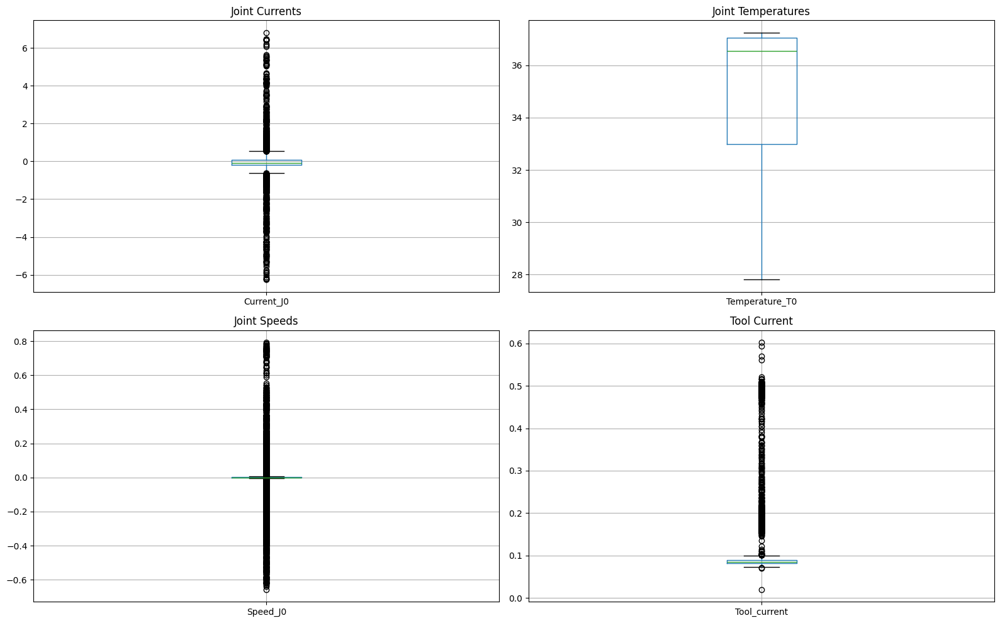

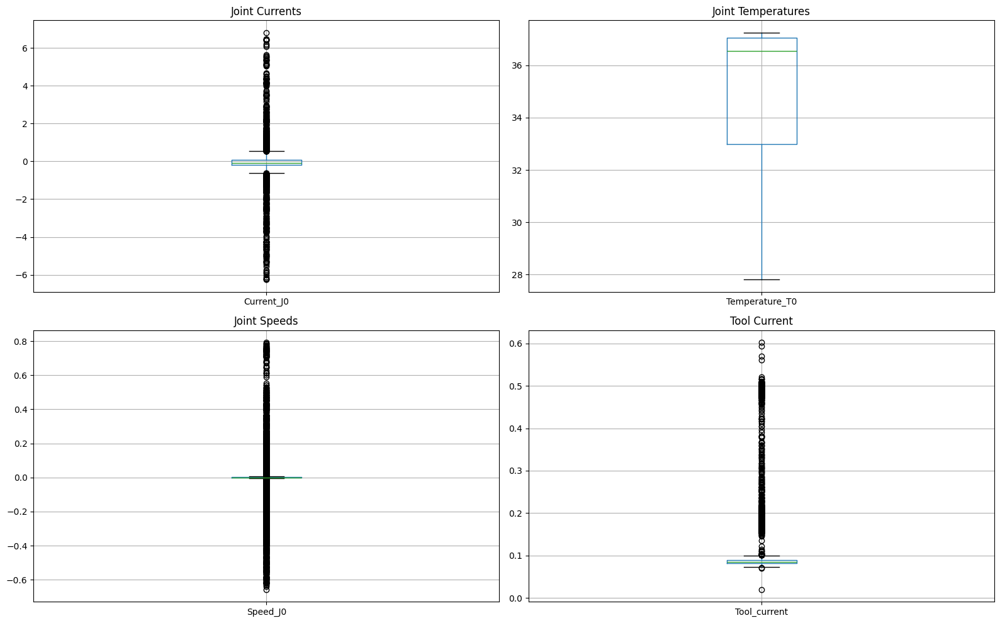

In [ ]:
def plot_boxplots(df):
    df = df.copy()
    fig, axes = plt.subplots(2, 2, figsize=(16,10))

    curr_cols = [c for c in [f'Current_J{j}' for j in range(6)] if c in df.columns]
    temp_cols = [c for c in ['Temperature_T0'] + [f'Temperature_J{j}' for j in range(1,6)] if c in df.columns]
    speed_cols = [f'Speed_J{j}' for j in range(6) if f'Speed_J{j}' in df.columns]
    tool_cols = [c for c in ['Tool_current'] if c in df.columns]

    if curr_cols:
        df[curr_cols].boxplot(ax=axes[0,0])
        axes[0,0].set_title("Joint Currents")
    if temp_cols:
        df[temp_cols].boxplot(ax=axes[0,1])
        axes[0,1].set_title("Joint Temperatures")
    if speed_cols:
        df[speed_cols].boxplot(ax=axes[1,0])
        axes[1,0].set_title("Joint Speeds")
    if tool_cols:
        df[tool_cols].boxplot(ax=axes[1,1])
        axes[1,1].set_title("Tool Current")

    plt.tight_layout()
    plt.show()

plot_boxplots(df_joint0_grip_clean)
plot_boxplots(df_joint0_stop_clean)

## Outlier Analysis from Boxplots



### Key Insights:
- **Joint Currents (J0–J5):**
  - Strong presence of outliers, especially in J0, J1, J2, and J4.
  - Negative currents dominate, which may indicate opposing torque or sudden load changes.
  - Suggests potential instability in joint behavior during certain cycles.

- **Joint Temperatures (T0–T5):**
  - Generally stable between 30–45 °C.
  - Some abnormal sudden drops (<30 °C), likely sensor glitches or unrealistic readings.

- **Joint Speeds (J0–J5):**
  - Mostly around zero, but with frequent spikes in both directions.
  - Indicates abnormal accelerations, possibly tied to grip loss or protective stops.

- **Tool Current:**
  - Normally very low (~0.1).
  - Contains many sharp spikes (>0.5).
  



In [ ]:

def plot_cycle_outliers(df):
    if 'cycle' in df.index.names:
        df = df.reset_index(drop=True)

    df = df.loc[:, ~df.columns.duplicated()]

    cycle_outliers = df.groupby('cycle', as_index=False).agg(
        total_outliers=('outlier_count', 'sum'),
        protective=('Robot_ProtectiveStop', 'max'),
    )


    plt.figure(figsize=(15,6))
    plt.plot(cycle_outliers['cycle'], cycle_outliers['total_outliers'],
             label="Outlier Count", color="blue")
    
    plt.scatter(cycle_outliers.loc[cycle_outliers['protective']==1, 'cycle'],
                cycle_outliers.loc[cycle_outliers['protective']==1, 'total_outliers'],
                color="red", marker="x", label="Protective Stop")
    


    plt.title("Outlier Counts per Cycle with Faults")
    plt.xlabel("Cycle")
    plt.ylabel("Number of Outliers")
    plt.legend()
    plt.tight_layout()
    plt.show()


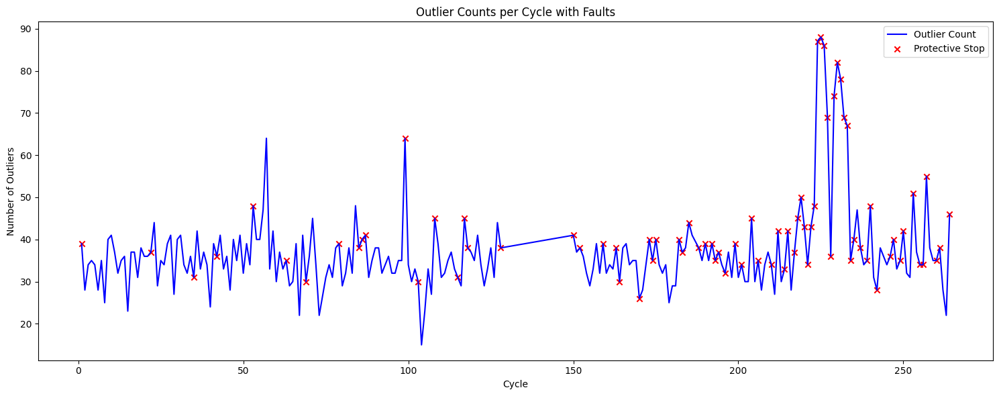

In [ ]:
plot_cycle_outliers(df_joint0_stop_clean)


In [ ]:

def plot_cycle_outliers(df):
    if 'cycle' in df.index.names:
        df = df.reset_index(drop=True)

    df = df.loc[:, ~df.columns.duplicated()]

    cycle_outliers = df.groupby('cycle', as_index=False).agg(
        total_outliers=('outlier_count', 'sum'),
        grip=('grip_lost', 'max'),
    )

    plt.figure(figsize=(15,6))
    plt.plot(cycle_outliers['cycle'], cycle_outliers['total_outliers'],
             label="Outlier Count", color="blue")
    plt.scatter(cycle_outliers.loc[cycle_outliers['grip']==1, 'cycle'],
                cycle_outliers.loc[cycle_outliers['grip']==1, 'total_outliers'],
                color="orange", marker="o", label="Grip Lost")
    


    plt.title("Outlier Counts per Cycle with Faults")
    plt.xlabel("Cycle")
    plt.ylabel("Number of Outliers")
    plt.legend()
    plt.tight_layout()
    plt.show()


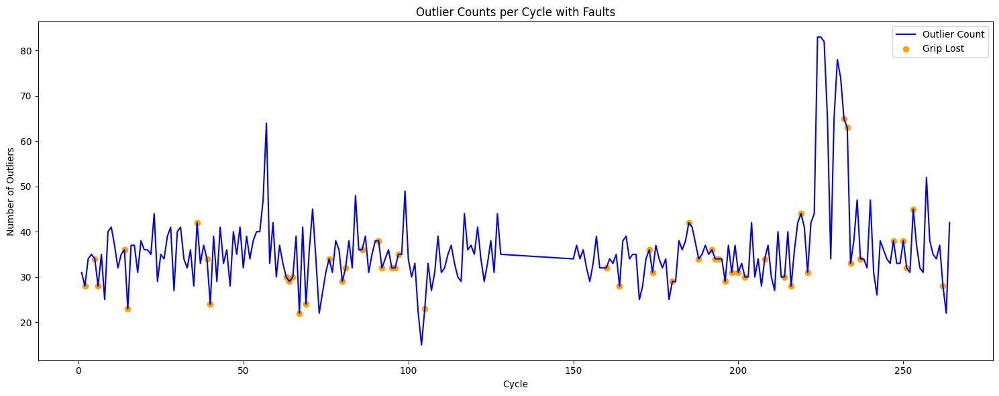

In [ ]:
plot_cycle_outliers(df_joint0_grip_clean)


In [ ]:
def outliers_during_faults(df, outlier_col='outlier_count'):
    
    fault_cycles = df[df['Robot_ProtectiveStop'] == 1]

    numeric_cols = fault_cycles.select_dtypes(include='number')

    outlier_summary = numeric_cols.drop(columns=['cycle', 'Robot_ProtectiveStop'], errors='ignore') \
                                  .sum() \
                                  .sort_values(ascending=False)

    return outlier_summary

summary = outliers_during_faults(df_joint0_stop_clean)
print(summary.head(12))


Num               1.212192e+06
Temperature_T0    9.968688e+03
outlier_count     3.790000e+02
abs_Current_J0    6.579455e+01
Tool_current      2.467720e+01
Current_J0        7.097818e+00
abs_Speed_J0      2.658016e+00
power_J0          1.294708e+00
sudden0          -9.048013e-01
Speed_J0         -1.371385e+00
dtype: float64


## Outlier–Fault Investigation



### Key Findings:
1. **Outlier Count per Cycle:**
   - Cycles with fault events (Protective Stop or Grip Loss ) tend to have **much higher outlier counts**.
   - Notable spikes around certain cycles  strongly align with multiple faults.

2. **Top Outlier-Contributing Features:**
   - The majority of anomalies come from **joint speeds**.
   - Smaller but important contributions from **joint currents**  and **Tool Current**.

3. **Interpretation:**
   - Fault cycles are often preceded by **irregular or extreme joint speeds**.
   - Currents and tool current also show anomalies, but less frequently compared to speeds.
   - This suggests that **speed instabilities are strong indicators of fault conditions**.




# JOINT1

In [ ]:
df_joint1=pd.read_csv('Dataset/joint_1_features (1).csv')
df_joint1.head()

,Num,Timestamp,Current_J1,Temperature_J1,Speed_J1,Tool_current,cycle,Robot_ProtectiveStop,grip_lost
0,1,2022-10-26T08:17:21.847Z,-2.024669,29.3750,-0.000490,0.082732,1,0.0,False
1,2,2022-10-26T08:17:22.852Z,-2.278456,29.3125,-0.000304,0.505895,1,0.0,False
2,3,2022-10-26T08:17:23.857Z,-2.800408,29.3125,0.007795,0.079420,1,0.0,False
3,4,2022-10-26T08:17:24.863Z,-3.687768,29.3125,-0.004911,0.083325,1,0.0,False
4,5,2022-10-26T08:17:25.877Z,-2.938830,29.3750,0.005567,0.086379,1,0.0,False


In [ ]:
convert_to_timestamp(df_joint1)
df_joint1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   Num                   7409 non-null   int64              
 1   Timestamp             7409 non-null   datetime64[ns, UTC]
 2   Current_J1            7355 non-null   float64            
 3   Temperature_J1        7355 non-null   float64            
 4   Speed_J1              7355 non-null   float64            
 5   Tool_current          7355 non-null   float64            
 6   cycle                 7409 non-null   int64              
 7   Robot_ProtectiveStop  7355 non-null   float64            
 8   grip_lost             7409 non-null   bool               
dtypes: bool(1), datetime64[ns, UTC](1), float64(5), int64(2)
memory usage: 470.4 KB


In [ ]:
remove_strip(df_joint1)

,Num,Timestamp,Current_J1,Temperature_J1,Speed_J1,Tool_current,cycle,Robot_ProtectiveStop,grip_lost
0,1,2022-10-26 08:17:21.847000+00:00,-2.024669,29.3750,-4.897555e-04,0.082732,1,0.0,False
1,2,2022-10-26 08:17:22.852000+00:00,-2.278456,29.3125,-3.036502e-04,0.505895,1,0.0,False
2,3,2022-10-26 08:17:23.857000+00:00,-2.800408,29.3125,7.794622e-03,0.079420,1,0.0,False
3,4,2022-10-26 08:17:24.863000+00:00,-3.687768,29.3125,-4.911367e-03,0.083325,1,0.0,False
4,5,2022-10-26 08:17:25.877000+00:00,-2.938830,29.3750,5.566942e-03,0.086379,1,0.0,False
5,6,2022-10-26 08:17:26.885000+00:00,-2.162542,29.3750,9.265704e-05,0.188310,1,0.0,False
6,7,2022-10-26 08:17:27.901000+00:00,-1.757647,29.3750,0.000000e+00,0.085192,1,0.0,False
7,8,2022-10-26 08:17:28.903000+00:00,-1.836465,29.3750,0.000000e+00,0.087058,1,0.0,False
8,9,2022-10-26 08:17:29.905000+00:00,-2.563738,29.3750,2.408654e-03,0.085785,1,0.0,False
9,10,2022-10-26 08:17:30.909000+00:00,-1.750777,29.3750,4.995751e-03,0.085020,1,0.0,False


# NUll values for J1

In [ ]:
df_joint1.isnull().sum()

Num                      0
Timestamp                0
Current_J1              54
Temperature_J1          54
Speed_J1                54
Tool_current            54
cycle                    0
Robot_ProtectiveStop    54
grip_lost                0
dtype: int64

In [ ]:
df_joint1_clean=fill_null_with_fandb(df_joint1)
df_joint1_clean.isnull().sum()

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\428220627.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  clean_data = df.groupby('cycle').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
C:\Users\youss\AppData\Local\Temp\ipykernel_13336\428220627.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  clean_data = df.groupby('cycle').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


Num                     0
Timestamp               0
Current_J1              0
Temperature_J1          0
Speed_J1                0
Tool_current            0
cycle                   0
Robot_ProtectiveStop    0
grip_lost               0
dtype: int64

# feature engineering for J1

In [ ]:
df_joint1=add_robot_features(df_joint1_clean)
df_joint1.columns

Index(['Num', 'Timestamp', 'Current_J1', 'Temperature_J1', 'Speed_J1',
       'Tool_current', 'cycle', 'Robot_ProtectiveStop', 'grip_lost',
       'abs_Current_J1', 'abs_Speed_J1', 'sudden1', 'power_J1'],
      dtype='object')

# EDA for J1

In [ ]:
df_joint1.isnull().sum()

Num                     0
Timestamp               0
Current_J1              0
Temperature_J1          0
Speed_J1                0
Tool_current            0
cycle                   0
Robot_ProtectiveStop    0
grip_lost               0
abs_Current_J1          0
abs_Speed_J1            0
sudden1                 1
power_J1                0
dtype: int64

In [ ]:
df_joint1["sudden1"].fillna(df_joint1["sudden1"].mean(), inplace=True)


C:\Users\youss\AppData\Local\Temp\ipykernel_13336\2200978750.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_joint1["sudden1"].fillna(df_joint1["sudden1"].mean(), inplace=True)


In [ ]:
features=['Current_J1',"Temperature_J1",'Speed_J1','Tool_current','abs_Current_J1','abs_Speed_J1','sudden1','power_J1']
univariate_analysis_protective=univariate_analysis(df_joint1,features,"Robot_ProtectiveStop")
univariate_analysis_protective

,feature,mean_no_fault,mean_fault,cohens_d,t_stat,p_value,AUC
3,Tool_current,0.110511,0.088449,-0.279074,8.781327,5.679781e-17,0.419020
4,abs_Current_J1,2.289062,2.757940,0.611624,-8.247045,5.570898e-15,0.698588
0,Current_J1,-2.279789,-2.740640,-0.579671,7.701712,2.099780e-13,0.301251
1,Temperature_J1,37.633126,38.623880,0.305967,-6.131565,2.622704e-09,0.588581
2,Speed_J1,-0.000439,0.013557,0.284206,-2.722837,6.871930e-03,0.522557
7,power_J1,0.053733,0.070446,0.134505,-1.332034,1.839124e-01,0.480566
5,abs_Speed_J1,0.020453,0.025616,0.115290,-1.039445,2.994826e-01,0.474217
6,sudden1,-0.000065,0.001650,0.023105,-0.197453,8.436151e-01,0.517130


In [ ]:
univariate_analysis(df_joint1,features,"grip_lost")

,feature,mean_no_fault,mean_fault,cohens_d,t_stat,p_value,AUC
7,power_J1,0.055579,0.018489,-0.298831,13.423900,4.354066e-35,0.519826
5,abs_Speed_J1,0.021038,0.009139,-0.265983,9.544974,2.050629e-19,0.525263
4,abs_Current_J1,2.316533,2.017274,-0.388675,8.817925,1.240856e-16,0.362583
0,Current_J1,-2.306634,-2.017274,0.362523,-8.502680,1.060143e-15,0.637393
1,Temperature_J1,37.723538,36.104424,-0.501158,6.047101,5.294028e-09,0.404347
3,Tool_current,0.110131,0.096362,-0.174017,4.621603,5.669026e-06,0.495374
2,Speed_J1,0.000261,-0.005029,-0.107293,3.882864,1.224488e-04,0.404765
6,sudden1,0.000210,-0.006177,-0.086051,2.356836,1.906657e-02,0.475092


In [ ]:
quartile_fault_analysis(df_joint1_clean, "Current_J1", "Robot_ProtectiveStop")

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\712805542.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.086346,1853,"(-5.8100000000000005, -2.664]"
1,Q2,0.024298,1852,"(-2.664, -2.233]"
2,Q3,0.024298,1852,"(-2.233, -1.778]"
3,Q4,0.015659,1852,"(-1.778, 1.084]"


In [ ]:
quartile_fault_analysis(df_joint1_clean, "Speed_J1", "Robot_ProtectiveStop")

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\712805542.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.031301,1853,"(-0.332, -0.00066]"
1,Q2,0.040328,3050,"(-0.00066, 0.0]"
2,Q3,0.050459,654,"(0.0, 0.000542]"
3,Q4,0.035097,1852,"(0.000542, 0.616]"


In [ ]:
quartile_fault_analysis(df_joint1_clean, "Temperature_J1", "Robot_ProtectiveStop")

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\712805542.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.019829,1866,"(29.311, 35.375]"
1,Q2,0.038521,1947,"(35.375, 39.688]"
2,Q3,0.039872,1881,"(39.688, 40.125]"
3,Q4,0.053644,1715,"(40.125, 40.5]"


In [ ]:
quartile_fault_analysis(df_joint1_clean, "Tool_current", "Robot_ProtectiveStop")

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\712805542.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby("quartile")[target].agg(


,quartile,fault_rate,count,range
0,Q1,0.040021,1874,"(0.0192, 0.0825]"
1,Q2,0.052603,1863,"(0.0825, 0.0852]"
2,Q3,0.039825,1833,"(0.0852, 0.0895]"
3,Q4,0.017945,1839,"(0.0895, 0.602]"


In [ ]:
stats_protective(df_joint1_clean,'Temperature_J1')

Temperature_J1                                         \
                              count       mean       std      min      25%   
Robot_ProtectiveStop                                                         
0.0                          7130.0  37.633126  3.259811  29.3125  35.3125   
1.0                           279.0  38.623880  2.620797  29.4375  37.1250   

                                                
                          50%     75%      max  
Robot_ProtectiveStop                            
0.0                   39.6875  40.125  40.5000  
1.0                   39.9375  40.250  40.4375

In [ ]:
stats_grip(df_joint1_clean,'Temperature_J1')

Temperature_J1                                                  \
                   count       mean       std      min      25%      50%   
grip_lost                                                                  
False             7166.0  37.723538  3.195868  29.3125  35.4375  39.6875   
True               243.0  36.104424  4.132119  29.5000  31.0625  36.5000   

                            
              75%      max  
grip_lost                   
False      40.125  40.4375  
True       40.000  40.5000

In [ ]:
stats_protective(df_joint1_clean,'Current_J1')

Current_J1                                          \
                          count      mean       std       min       25%   
Robot_ProtectiveStop                                                      
0.0                      7130.0 -2.279789  0.786571 -5.808734 -2.645310   
1.0                       279.0 -2.740640  0.987297 -4.640350 -3.479173   

                                                    
                           50%       75%       max  
Robot_ProtectiveStop                                
0.0                  -2.217855 -1.769715  1.074144  
1.0                  -2.822606 -2.183275  1.083596

In [ ]:
stats_grip(df_joint1_clean,'Current_J1')

Current_J1                                                    \
               count      mean       std       min       25%       50%   
grip_lost                                                                
False         7166.0 -2.306634  0.806137 -5.808734 -2.669117 -2.244652   
True           243.0 -2.017274  0.509308 -4.336777 -2.455471 -1.767407   

                               
                75%       max  
grip_lost                      
False     -1.789185  1.083596  
True      -1.641585 -0.357726

In [ ]:
stats_protective(df_joint1_clean,'Speed_J1')

Speed_J1                                               \
                        count      mean       std       min       25%  50%   
Robot_ProtectiveStop                                                         
0.0                    7130.0 -0.000439  0.047283 -0.330833 -0.000731  0.0   
1.0                     279.0  0.013557  0.085347 -0.184411 -0.000185  0.0   

                                          
                           75%       max  
Robot_ProtectiveStop                      
0.0                   0.000563  0.342549  
1.0                   0.000306  0.615526

In [ ]:
stats_grip(df_joint1_clean,'Speed_J1')

Speed_J1                                                    \
             count      mean       std       min       25%       50%   
grip_lost                                                              
False       7166.0  0.000261  0.050011 -0.330833 -0.000536  0.000000   
True         243.0 -0.005029  0.019139 -0.095336 -0.006777 -0.000046   

                               
                75%       max  
grip_lost                      
False      0.000608  0.615526  
True       0.000000  0.138693

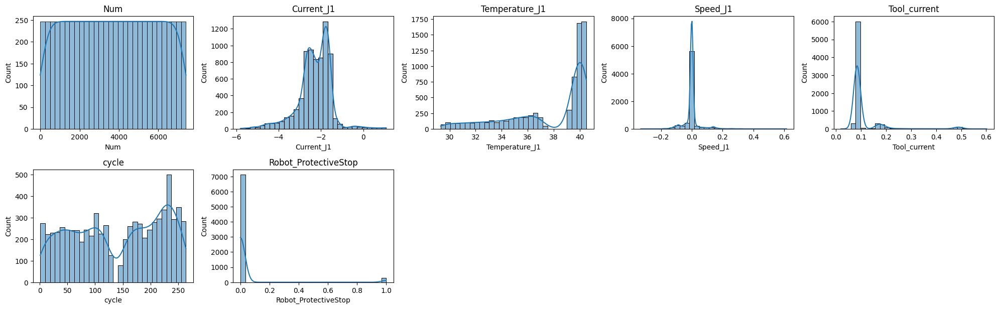

In [ ]:
plot_histograms(df_joint1_clean)

# j2

In [ ]:
df_j2=pd.read_csv("Dataset/joint_2_features (1).csv")


In [ ]:
df_j2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Num                   7409 non-null   int64  
 1   Timestamp             7409 non-null   object 
 2   Current_J2            7355 non-null   float64
 3   Temperature_J2        7355 non-null   float64
 4   Speed_J2              7355 non-null   float64
 5   Tool_current          7355 non-null   float64
 6   cycle                 7409 non-null   int64  
 7   Robot_ProtectiveStop  7355 non-null   float64
 8   grip_lost             7409 non-null   bool   
dtypes: bool(1), float64(5), int64(2), object(1)
memory usage: 470.4+ KB


In [ ]:
remove_strip(df_j2)

,Num,Timestamp,Current_J2,Temperature_J2,Speed_J2,Tool_current,cycle,Robot_ProtectiveStop,grip_lost
0,1,2022-10-26T08:17:21.847Z,-1.531442,29.3750,1.310194e-03,0.082732,1,0.0,False
1,2,2022-10-26T08:17:22.852Z,-0.866556,29.4375,2.185137e-03,0.505895,1,0.0,False
2,3,2022-10-26T08:17:23.857Z,-2.304336,29.4375,-2.535874e+00,0.079420,1,0.0,False
3,4,2022-10-26T08:17:24.863Z,-1.217652,29.4375,-9.096014e-03,0.083325,1,0.0,False
4,5,2022-10-26T08:17:25.877Z,-1.794076,29.4375,1.138345e-03,0.086379,1,0.0,False
5,6,2022-10-26T08:17:26.885Z,-1.211779,29.4375,2.624108e-04,0.188310,1,0.0,False
6,7,2022-10-26T08:17:27.901Z,-0.960634,29.4375,0.000000e+00,0.085192,1,0.0,False
7,8,2022-10-26T08:17:28.903Z,-0.961322,29.4375,0.000000e+00,0.087058,1,0.0,False
8,9,2022-10-26T08:17:29.905Z,-1.418934,29.4375,-1.548259e-02,0.085785,1,0.0,False
9,10,2022-10-26T08:17:30.909Z,-1.979400,29.4375,-1.699568e-02,0.085020,1,0.0,False


In [ ]:
df_j2_clean=fill_null_with_fandb(df_j2)
df_j2_clean.isnull().sum()

C:\Users\youss\AppData\Local\Temp\ipykernel_13336\428220627.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  clean_data = df.groupby('cycle').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
C:\Users\youss\AppData\Local\Temp\ipykernel_13336\428220627.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  clean_data = df.groupby('cycle').apply(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


Num                     0
Timestamp               0
Current_J2              0
Temperature_J2          0
Speed_J2                0
Tool_current            0
cycle                   0
Robot_ProtectiveStop    0
grip_lost               0
dtype: int64

In [ ]:
df_j2_clean=add_robot_features(df_j2_clean)
df_j2_clean.columns

Index(['Num', 'Timestamp', 'Current_J2', 'Temperature_J2', 'Speed_J2',
       'Tool_current', 'cycle', 'Robot_ProtectiveStop', 'grip_lost',
       'abs_Current_J2', 'abs_Speed_J2', 'sudden2', 'power_J2'],
      dtype='object')

In [ ]:
df_j2_clean["sudden2"].fillna(df_j2_clean["sudden2"].mean(), inplace=True)


C:\Users\youss\AppData\Local\Temp\ipykernel_13336\1031907263.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_j2_clean["sudden2"].fillna(df_j2_clean["sudden2"].mean(), inplace=True)


In [ ]:
features=["Current_J2","Temperature_J2","Speed_J2","Tool_current","sudden2","power_J2","abs_Current_J2","abs_Speed_J2"]
univariate_analysis_protective=univariate_analysis(df_j2_clean,features,"grip_lost")
univariate_analysis_protective

,feature,mean_no_fault,mean_fault,cohens_d,t_stat,p_value,AUC
6,abs_Current_J2,1.241158,0.966972,-0.508528,11.248638,1.837906e-24,0.319742
0,Current_J2,-1.207555,-0.966972,0.395345,-9.776004,1.068605e-19,0.673261
1,Temperature_J2,38.130181,36.443673,-0.511956,6.143732,3.129258e-09,0.402644
3,Tool_current,0.110131,0.096362,-0.174017,4.621603,5.669026e-06,0.495374
5,power_J2,0.294750,0.154622,-0.147811,3.825989,1.589214e-04,0.504806
2,Speed_J2,-0.000079,0.146782,0.200940,-3.720530,2.423324e-04,0.532578
7,abs_Speed_J2,0.235541,0.178752,-0.081954,1.462688,1.447366e-01,0.516476
4,sudden2,0.002414,-0.071201,-0.071218,0.978522,3.287431e-01,0.484348
